# Packages

In [1]:
import warnings
warnings.filterwarnings("ignore")
import os
from pathlib import Path

import pandas as pd
import numpy as np
import polars as pl
import scipy.stats as stats
import seaborn as sns
import statsmodels.formula.api as smf
import statsmodels.api as sm
import matplotlib.pyplot as plt
import math
import plotly.express as px
import plotly

from statsmodels.tsa.deterministic import DeterministicProcess, CalendarFourier
from statsmodels.graphics.tsaplots import plot_pacf

from sklearn.model_selection import GroupKFold, KFold, train_test_split, cross_val_score, TimeSeriesSplit
from sklearn.preprocessing import RobustScaler, LabelEncoder
from sklearn.metrics import mean_squared_error, r2_score, make_scorer, accuracy_score, median_absolute_error, classification_report, mean_absolute_error, roc_auc_score, roc_curve
from sklearn.pipeline import make_pipeline
from sklearn.decomposition import PCA
from imblearn.over_sampling import RandomOverSampler
from scipy.optimize import minimize

import xgboost as xgb
import lightgbm as lgb
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor, RandomForestClassifier
from sklearn.linear_model import Ridge
from sklearn.svm import LinearSVC
from sklearn.svm import SVR
from sklearn.linear_model import LogisticRegression

import optuna
import unicodedata


pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
pd.set_option('display.float_format', lambda x: "%.4f" % x)
# pd.options.plotting.backend = "plotly"

plt.style.use('ggplot')
sns.set_style('darkgrid')

## Helper Functions

In [2]:
def get_info(df):
    missing_values_train = pd.DataFrame({'Feature': df.columns,
                              'No. of Missing Values': df.isnull().sum().values,
                              '% of Missing Values': ((df.isnull().sum().values)/len(df)*100)})

    unique_values = pd.DataFrame({'Feature': df.columns,
                                'No. of Unique Values': df.nunique().values})

    feature_types = pd.DataFrame({'Feature': df.columns,
                                'DataType': df.dtypes})

    merged_df = pd.merge(missing_values_train, unique_values, on='Feature', how='left')
    merged_df = pd.merge(merged_df, feature_types, on='Feature', how='left')

    return merged_df

def get_cols_as_list_by_type(df, target_col=None):
    if target_col is not None:
        df = df.drop(target_col, axis=1)
        
    numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
    categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
    return numeric_cols, categorical_cols

# plot all pairs in rows of 6 
def pairplot_list_against_list(df, l1, l2):
    pairs = [(x, y) for x in l1 for y in l2]
    num_plots = len(pairs)
    cols = 6
    rows = math.ceil(num_plots / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
    axes = axes.flatten()

    for i, (x, y) in enumerate(pairs):
        sns.scatterplot(data=df, x=x, y=y, ax=axes[i])
        axes[i].set_xlabel(x)
        axes[i].set_ylabel(y)

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Reading Data

In [3]:
data_dir = "./kyle"

data_dir_path = Path(data_dir)
score_file_paths = [
    f for f in data_dir_path.rglob("*.csv") 
    if f.is_file() and (f.name != "judge_nationalities.csv" and f.name != "judges_nationalities_v2.csv")
]
df_list = [pd.read_csv(f) for f in score_file_paths]
data_df = pd.concat(df_list, ignore_index=True)
judge_cols = [f"J{i}" for i in range(1,10)]
data_df = data_df.assign(judge_avg=lambda x: x[judge_cols].mean(axis=1))
data_df.head()

,rank,name,noc,starting_number,tss,tes,tpcs,deductions,base_value,competition,element,element_no,extra_points,factor,final_score,goe,info,is_element,program_component,year,J1,J2,J3,J4,J5,J6,J7,J8,J9,is_short_program,category,event_type,judge_avg
0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,1,pairs,individual,3.0000
1,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,4.4000,wc2018,3S,2.0000,0.0000,NaN,5.9000,1.5000,NaN,1,NaN,1718,2.0000,2.0000,3.0000,2.0000,3.0000,1.0000,1.0000,3.0000,2.0000,1,pairs,individual,2.1111
2,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,5.5000,wc2018,3FTh,3.0000,0.0000,NaN,6.4000,0.9000,NaN,1,NaN,1718,2.0000,0.0000,1.0000,2.0000,3.0000,1.0000,0.0000,2.0000,1.0000,1,pairs,individual,1.3333
3,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,4.5000,wc2018,3Li4,4.0000,0.0000,NaN,6.0000,1.5000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,2.0000,3.0000,3.0000,1,pairs,individual,2.8889
4,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,3.9000,wc2018,StSq4,5.0000,0.0000,NaN,6.0000,2.1000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,1,pairs,individual,3.0000


In [4]:
data_df.shape

(59840, 33)

## Adding Judge Nationalities

In [5]:
# def normalize_name(name):
#     if not isinstance(name, str):
#         return name

#     replacements = {
#         'ä': 'a', 'ö': 'o', 'ü': 'u',
#         'Ä': 'a', 'Ö': 'o', 'Ü': 'u',
#         'ø': 'o', 'Ø': 'o',
#         'ß': 'ss',
#         'é': 'e', 'è': 'e', 'ê': 'e', 'ë': 'e',
#         'É': 'e', 'È': 'e', 'Ê': 'e', 'Ë': 'e',
#         'á': 'a', 'à': 'a', 'â': 'a', 'ã': 'a', 'å': 'a',
#         'Á': 'a', 'À': 'a', 'Â': 'a', 'Ã': 'a', 'Å': 'a',
#         'í': 'i', 'ì': 'i', 'î': 'i', 'ï': 'i',
#         'Í': 'i', 'Ì': 'i', 'Î': 'i', 'Ï': 'i',
#         'ó': 'o', 'ò': 'o', 'ô': 'o', 'õ': 'o',
#         'Ó': 'o', 'Ò': 'o', 'Ô': 'o', 'Õ': 'o',
#         'ú': 'u', 'ù': 'u', 'û': 'u',
#         'Ú': 'u', 'Ù': 'u', 'Û': 'u',
#         'ñ': 'n', 'Ñ': 'n',
#         'ç': 'c', 'Ç': 'c',
#         'ý': 'y', 'ÿ': 'y', 'Ý': 'y', 'Ÿ': 'y'
#     }

#     for old, new in replacements.items():
#         name = name.replace(old, new)

#     return name.lower().strip()


# ------------------------
# Normalization
# ------------------------

def normalize_name(name):
    if not isinstance(name, str):
        return name
    
    # Remove accents safely
    name = unicodedata.normalize("NFKD", name)
    name = "".join(c for c in name if not unicodedata.combining(c))
    
    return name.strip()


def name_key(name):
    if not isinstance(name, str):
        return name
    
    name = normalize_name(name)
    tokens = name.split()
    tokens = sorted(tokens)
    
    return " ".join(tokens)



In [6]:
judge_path = data_dir + "/judge_nationalities.csv"

judge_df = pd.read_csv(judge_path)
judge_df = judge_df.dropna(subset=["category"])

judge_dfv2 = pd.read_csv(data_dir + "/judges_nationalities_v2.csv")
judge_dfv2 = judge_dfv2.rename(
    columns={"iso3c": "judge_nationality", "Name": "judge_name"}
)

# Create order-invariant keys

judge_df["judge_name"] = judge_df["judge_name"].apply(name_key)
judge_dfv2["judge_name"] = judge_dfv2["judge_name"].apply(name_key)

# Build lookup using key
judge_lookup = (
    judge_dfv2[["judge_name", "judge_nationality"]]
    .drop_duplicates(subset=["judge_name"])
)

judge_df = judge_df.merge(
    judge_lookup,
    on="judge_name",
    how="left",
    suffixes=("", "_v2")
)

# Replace ISU when better info available
judge_df.loc[judge_df["judge_nationality"] == "ISU", "judge_nationality"] = (
    judge_df.loc[judge_df["judge_nationality"] == "ISU", "judge_nationality_v2"]
    .fillna("ISU")
)

judge_df = judge_df.drop(columns=["judge_nationality_v2"])


judge_df.to_csv(judge_path, index=False)


In [7]:
judge_df[lambda x: x.judge_nationality == "ISU"]

,competition,isu_year,is_short_program,category,event_type,judge_number,judge_name,judge_nationality


In [8]:
judge_df = (
    judge_df
        .pivot(
            index=['competition', 'isu_year', 'is_short_program', 'category', 'event_type'],
            columns='judge_number',
            values=['judge_name', 'judge_nationality']
        )
)

judge_numbers = sorted(judge_df.columns.levels[1])
judge_df = judge_df.reindex(
    columns=[(field, j) for j in judge_numbers for field in ['judge_name', 'judge_nationality']]
)

judge_df.columns = [
    f'judge_name{j}' if field == 'judge_name'
    else f'judge_nat{j}'
    for field, j in judge_df.columns
]

judge_df = judge_df.reset_index()
judge_df.head()

,competition,isu_year,is_short_program,category,event_type,judge_name1,judge_nat1,judge_name2,judge_nat2,judge_name3,judge_nat3,judge_name4,judge_nat4,judge_name5,judge_nat5,judge_name6,judge_nat6,judge_name7,judge_nat7,judge_name8,judge_nat8,judge_name9,judge_nat9
0,ec2018,1718,0,men,individual,hege jensen rosto,NOR,CHIGOGIDZE Salome,GEO,Claudia FASSORA,SUI,AHISKAL Senem,TUR,Florence VUYLSTEKER,FRA,FAIG Ulla,GER,KRUGLOVA Natalia,UKR,Adriana DOMANSKA,SVK,Jeroen PRINS,NED
1,ec2018,1718,0,pairs,individual,Elena FOMINA,RUS,Ekaterina SEROVA,BLR,SMIDOVA Stanislava,CZE,BINZ-MOSER Prisca,SUI,KRAUZIENE Laimute,LTU,EHRHARDT Karin,AUT,Asa NORDBACK,SWE,CEROVAC Josip,CRO,Anthony LEROY,FRA
2,ec2018,1718,0,women,individual,ANILDI Ebru,TUR,DE Francoise RAPPARD,BEL,FEDCHENKO Igor,UKR,Kari-Anne OLSEN,NOR,ABELE Agita,LAT,Attila SOOS,HUN,KULIK Zanna,EST,Ann FINDLAY,GBR,KOSONEN Merja,FIN
3,ec2018,1718,1,men,individual,CHAPMAN Mary,GBR,Hanna THEN,POL,hege jensen rosto,NOR,FAIG Ulla,GER,Kadi ZVIRIK,EST,KANKAANRANTA Marjo,FIN,Adriana DOMANSKA,SVK,AHISKAL Senem,TUR,CHIGOGIDZE Salome,GEO
4,ec2018,1718,1,pairs,individual,EHRHARDT Karin,AUT,Anna KANTOR,ISR,Elke TREITZ,GER,CEROVAC Josip,CRO,Anthony LEROY,FRA,Margaret Worsfold,GBR,Asa NORDBACK,SWE,Massimo ORLANDINI,ITA,Elena FOMINA,RUS


In [9]:
judge_df[['competition', 'isu_year']].value_counts()

competition  isu_year
gpf1920      1920        12
gpf1819      1819        12
owg2022      2122        12
owg2018      1718        12
gpusa2019    1920         6
gpfra2019    1920         6
gpfra2021    2122         6
gpfra2022    2223         6
gpfra2023    2324         6
gpfra2024    2425         6
gpfra2025    2526         6
gpusa2017    1718         6
gpusa2018    1819         6
gpusa2021    2122         6
gpfra2017    1718         6
gpusa2022    2223         6
gpusa2023    2324         6
gpusa2024    2425         6
gpusa2025    2526         6
wc2018       1718         6
wc2021       2021         6
wc2022       2122         6
wc2024       2324         6
gpfra2018    1819         6
ec2018       1718         6
ec2019       1819         6
gpcan2025    2526         6
ec2020       1920         6
ec2022       2122         6
ec2023       2223         6
ec2024       2324         6
ec2025       2425         6
fc2018       1718         6
fc2019       1819         6
fc2020       1920         

In [10]:
data_df = data_df.rename(columns={"year":"isu_year"})
data_df = data_df.merge(judge_df, on=['competition', 'isu_year', 'is_short_program', 'category', 'event_type'], how='left')
data_df.head()

,rank,name,noc,starting_number,tss,tes,tpcs,deductions,base_value,competition,element,element_no,extra_points,factor,final_score,goe,info,is_element,program_component,isu_year,J1,J2,J3,J4,J5,J6,J7,J8,J9,is_short_program,category,event_type,judge_avg,judge_name1,judge_nat1,judge_name2,judge_nat2,judge_name3,judge_nat3,judge_name4,judge_nat4,judge_name5,judge_nat5,judge_name6,judge_nat6,judge_name7,judge_nat7,judge_name8,judge_nat8,judge_name9,judge_nat9
0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,1,pairs,individual,3.0000,MORANDI Tiziana,ITA,HOWARD Karen,CAN,Anthony LEROY,FRA,GLENN Roger,USA,Andreas WALDECK,GER,BINDER Elisabeth,AUT,Jia YAO,CHN,JELINEK Lisa,AUS,BLANC Christine,SUI
1,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,4.4000,wc2018,3S,2.0000,0.0000,NaN,5.9000,1.5000,NaN,1,NaN,1718,2.0000,2.0000,3.0000,2.0000,3.0000,1.0000,1.0000,3.0000,2.0000,1,pairs,individual,2.1111,MORANDI Tiziana,ITA,HOWARD Karen,CAN,Anthony LEROY,FRA,GLENN Roger,USA,Andreas WALDECK,GER,BINDER Elisabeth,AUT,Jia YAO,CHN,JELINEK Lisa,AUS,BLANC Christine,SUI
2,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,5.5000,wc2018,3FTh,3.0000,0.0000,NaN,6.4000,0.9000,NaN,1,NaN,1718,2.0000,0.0000,1.0000,2.0000,3.0000,1.0000,0.0000,2.0000,1.0000,1,pairs,individual,1.3333,MORANDI Tiziana,ITA,HOWARD Karen,CAN,Anthony LEROY,FRA,GLENN Roger,USA,Andreas WALDECK,GER,BINDER Elisabeth,AUT,Jia YAO,CHN,JELINEK Lisa,AUS,BLANC Christine,SUI
3,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,4.5000,wc2018,3Li4,4.0000,0.0000,NaN,6.0000,1.5000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,2.0000,3.0000,3.0000,1,pairs,individual,2.8889,MORANDI Tiziana,ITA,HOWARD Karen,CAN,Anthony LEROY,FRA,GLENN Roger,USA,Andreas WALDECK,GER,BINDER Elisabeth,AUT,Jia YAO,CHN,JELINEK Lisa,AUS,BLANC Christine,SUI
4,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,3.9000,wc2018,StSq4,5.0000,0.0000,NaN,6.0000,2.1000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,1,pairs,individual,3.0000,MORANDI Tiziana,ITA,HOWARD Karen,CAN,Anthony LEROY,FRA,GLENN Roger,USA,Andreas WALDECK,GER,BINDER Elisabeth,AUT,Jia YAO,CHN,JELINEK Lisa,AUS,BLANC Christine,SUI


In [11]:
# adding is same nationality for each judge
data_df = (
    data_df.assign(
        judge_same1 = lambda x: (x.judge_nat1 == x.noc).astype(int),
        judge_same2 = lambda x: (x.judge_nat2 == x.noc).astype(int),
        judge_same3 = lambda x: (x.judge_nat3 == x.noc).astype(int),
        judge_same4 = lambda x: (x.judge_nat4 == x.noc).astype(int),
        judge_same5 = lambda x: (x.judge_nat5 == x.noc).astype(int),
        judge_same6 = lambda x: (x.judge_nat6 == x.noc).astype(int),
        judge_same7 = lambda x: (x.judge_nat7 == x.noc).astype(int),
        judge_same8 = lambda x: (x.judge_nat8 == x.noc).astype(int),
        judge_same9 = lambda x: (x.judge_nat9 == x.noc).astype(int),
    )
)
data_df.head()

,rank,name,noc,starting_number,tss,tes,tpcs,deductions,base_value,competition,element,element_no,extra_points,factor,final_score,goe,info,is_element,program_component,isu_year,J1,J2,J3,J4,J5,J6,J7,J8,J9,is_short_program,category,event_type,judge_avg,judge_name1,judge_nat1,judge_name2,judge_nat2,judge_name3,judge_nat3,judge_name4,judge_nat4,judge_name5,judge_nat5,judge_name6,judge_nat6,judge_name7,judge_nat7,judge_name8,judge_nat8,judge_name9,judge_nat9,judge_same1,judge_same2,judge_same3,judge_same4,judge_same5,judge_same6,judge_same7,judge_same8,judge_same9
0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,1,pairs,individual,3.0000,MORANDI Tiziana,ITA,HOWARD Karen,CAN,Anthony LEROY,FRA,GLENN Roger,USA,Andreas WALDECK,GER,BINDER Elisabeth,AUT,Jia YAO,CHN,JELINEK Lisa,AUS,BLANC Christine,SUI,0,0,0,0,1,0,0,0,0
1,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,4.4000,wc2018,3S,2.0000,0.0000,NaN,5.9000,1.5000,NaN,1,NaN,1718,2.0000,2.0000,3.0000,2.0000,3.0000,1.0000,1.0000,3.0000,2.0000,1,pairs,individual,2.1111,MORANDI Tiziana,ITA,HOWARD Karen,CAN,Anthony LEROY,FRA,GLENN Roger,USA,Andreas WALDECK,GER,BINDER Elisabeth,AUT,Jia YAO,CHN,JELINEK Lisa,AUS,BLANC Christine,SUI,0,0,0,0,1,0,0,0,0
2,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,5.5000,wc2018,3FTh,3.0000,0.0000,NaN,6.4000,0.9000,NaN,1,NaN,1718,2.0000,0.0000,1.0000,2.0000,3.0000,1.0000,0.0000,2.0000,1.0000,1,pairs,individual,1.3333,MORANDI Tiziana,ITA,HOWARD Karen,CAN,Anthony LEROY,FRA,GLENN Roger,USA,Andreas WALDECK,GER,BINDER Elisabeth,AUT,Jia YAO,CHN,JELINEK Lisa,AUS,BLANC Christine,SUI,0,0,0,0,1,0,0,0,0
3,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,4.5000,wc2018,3Li4,4.0000,0.0000,NaN,6.0000,1.5000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,2.0000,3.0000,3.0000,1,pairs,individual,2.8889,MORANDI Tiziana,ITA,HOWARD Karen,CAN,Anthony LEROY,FRA,GLENN Roger,USA,Andreas WALDECK,GER,BINDER Elisabeth,AUT,Jia YAO,CHN,JELINEK Lisa,AUS,BLANC Christine,SUI,0,0,0,0,1,0,0,0,0
4,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,3.9000,wc2018,StSq4,5.0000,0.0000,NaN,6.0000,2.1000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,1,pairs,individual,3.0000,MORANDI Tiziana,ITA,HOWARD Karen,CAN,Anthony LEROY,FRA,GLENN Roger,USA,Andreas WALDECK,GER,BINDER Elisabeth,AUT,Jia YAO,CHN,JELINEK Lisa,AUS,BLANC Christine,SUI,0,0,0,0,1,0,0,0,0


# EDA on All Singles Data

## Initial Checks

In [12]:
info_df = get_info(data_df)
info_df.style.background_gradient(cmap='viridis')

,Feature,No. of Missing Values,% of Missing Values,No. of Unique Values,DataType
0,rank,0,0.000000,40,int64
1,name,0,0.000000,728,object
2,noc,0,0.000000,62,object
3,starting_number,0,0.000000,40,int64
4,tss,0,0.000000,3732,float64
5,tes,0,0.000000,3185,float64
6,tpcs,0,0.000000,2914,float64
7,deductions,0,0.000000,12,float64
8,base_value,18717,31.278409,515,float64
9,competition,0,0.000000,47,object


In [13]:
# column types
numeric_cols, categorical_cols = get_cols_as_list_by_type(data_df)
print("Numeric Columns:")
print(numeric_cols)
print("Categorical Columns:")
print(categorical_cols)

Numeric Columns:
['rank', 'starting_number', 'tss', 'tes', 'tpcs', 'deductions', 'base_value', 'element_no', 'extra_points', 'factor', 'final_score', 'goe', 'is_element', 'isu_year', 'J1', 'J2', 'J3', 'J4', 'J5', 'J6', 'J7', 'J8', 'J9', 'is_short_program', 'judge_avg', 'judge_same1', 'judge_same2', 'judge_same3', 'judge_same4', 'judge_same5', 'judge_same6', 'judge_same7', 'judge_same8', 'judge_same9']
Categorical Columns:
['name', 'noc', 'competition', 'element', 'info', 'program_component', 'category', 'event_type', 'judge_name1', 'judge_nat1', 'judge_name2', 'judge_nat2', 'judge_name3', 'judge_nat3', 'judge_name4', 'judge_nat4', 'judge_name5', 'judge_nat5', 'judge_name6', 'judge_nat6', 'judge_name7', 'judge_nat7', 'judge_name8', 'judge_nat8', 'judge_name9', 'judge_nat9']


In [14]:
to_add = ['isu_year', 'is_element', 'is_short_program', 'is_mens'] + [f'judge_nat{int(i)}' for i in range(1, 10)] + [f'judge_same{int(i)}' for i in range(1, 10)]
categorical_cols.extend(to_add)
numeric_cols = [c for c in numeric_cols if c not in to_add]
print("Numeric Columns:")
print(numeric_cols)
print("Categorical Columns:")
print(categorical_cols)

Numeric Columns:
['rank', 'starting_number', 'tss', 'tes', 'tpcs', 'deductions', 'base_value', 'element_no', 'extra_points', 'factor', 'final_score', 'goe', 'J1', 'J2', 'J3', 'J4', 'J5', 'J6', 'J7', 'J8', 'J9', 'judge_avg']
Categorical Columns:
['name', 'noc', 'competition', 'element', 'info', 'program_component', 'category', 'event_type', 'judge_name1', 'judge_nat1', 'judge_name2', 'judge_nat2', 'judge_name3', 'judge_nat3', 'judge_name4', 'judge_nat4', 'judge_name5', 'judge_nat5', 'judge_name6', 'judge_nat6', 'judge_name7', 'judge_nat7', 'judge_name8', 'judge_nat8', 'judge_name9', 'judge_nat9', 'isu_year', 'is_element', 'is_short_program', 'is_mens', 'judge_nat1', 'judge_nat2', 'judge_nat3', 'judge_nat4', 'judge_nat5', 'judge_nat6', 'judge_nat7', 'judge_nat8', 'judge_nat9', 'judge_same1', 'judge_same2', 'judge_same3', 'judge_same4', 'judge_same5', 'judge_same6', 'judge_same7', 'judge_same8', 'judge_same9']


In [15]:
# check for duplicates
data_df.loc[data_df.duplicated()]

,rank,name,noc,starting_number,tss,tes,tpcs,deductions,base_value,competition,element,element_no,extra_points,factor,final_score,goe,info,is_element,program_component,isu_year,J1,J2,J3,J4,J5,J6,J7,J8,J9,is_short_program,category,event_type,judge_avg,judge_name1,judge_nat1,judge_name2,judge_nat2,judge_name3,judge_nat3,judge_name4,judge_nat4,judge_name5,judge_nat5,judge_name6,judge_nat6,judge_name7,judge_nat7,judge_name8,judge_nat8,judge_name9,judge_nat9,judge_same1,judge_same2,judge_same3,judge_same4,judge_same5,judge_same6,judge_same7,judge_same8,judge_same9


## Continuous Variables

### Understanding Distribution

In [16]:
data_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
rank,59840.0000,10.2302,7.7588,1.0000,4.0000,8.0000,15.0000,40.0000
starting_number,59840.0000,10.3318,7.8155,1.0000,4.0000,8.0000,15.0000,40.0000
tss,59840.0000,101.1622,38.5301,24.7600,67.0100,97.7700,131.0700,228.9700
tes,59840.0000,51.2677,19.7089,10.0300,34.9700,48.8600,65.1600,138.4900
tpcs,59840.0000,50.3733,19.5397,15.7300,32.3700,49.5300,66.5500,97.2200
deductions,59840.0000,-0.2322,0.8887,-6.0000,-1.0000,0.0000,0.0000,9.0000
base_value,41123.0000,4.9227,2.7016,0.0000,3.1000,3.9000,6.0000,19.4700
element_no,41123.0000,5.4452,3.1623,1.0000,3.0000,5.0000,7.0000,13.0000
extra_points,41123.0000,0.1652,0.3713,0.0000,0.0000,0.0000,0.0000,1.0000
factor,18717.0000,1.5311,0.6959,0.8000,1.0000,1.6000,2.0000,3.3300


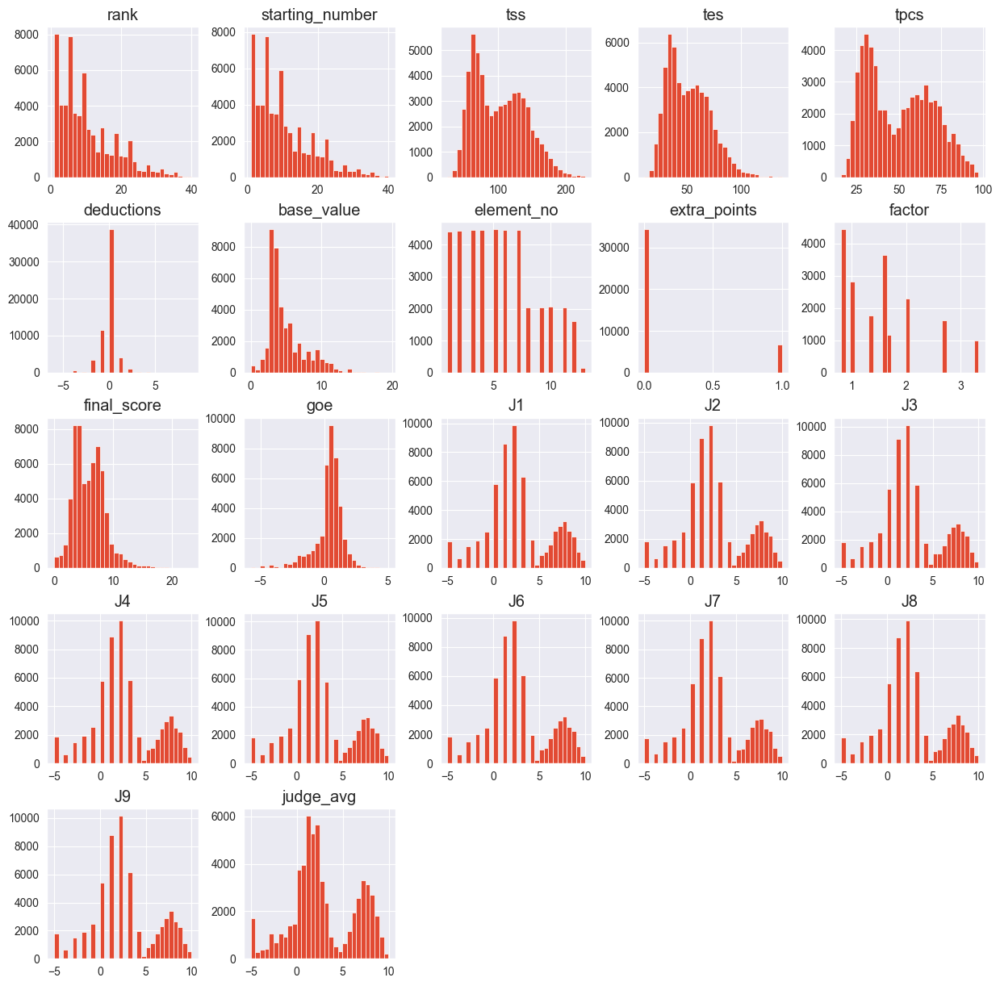

In [17]:
data_df[numeric_cols].hist(figsize=(15, 15), bins=30)
plt.show()

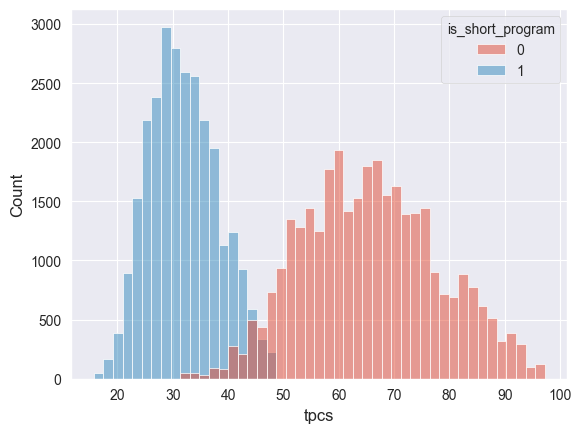

In [18]:
# why is tpcs bimodal
sns.histplot(
        data=data_df, 
        x="tpcs",
        hue="is_short_program",
    )
plt.show()

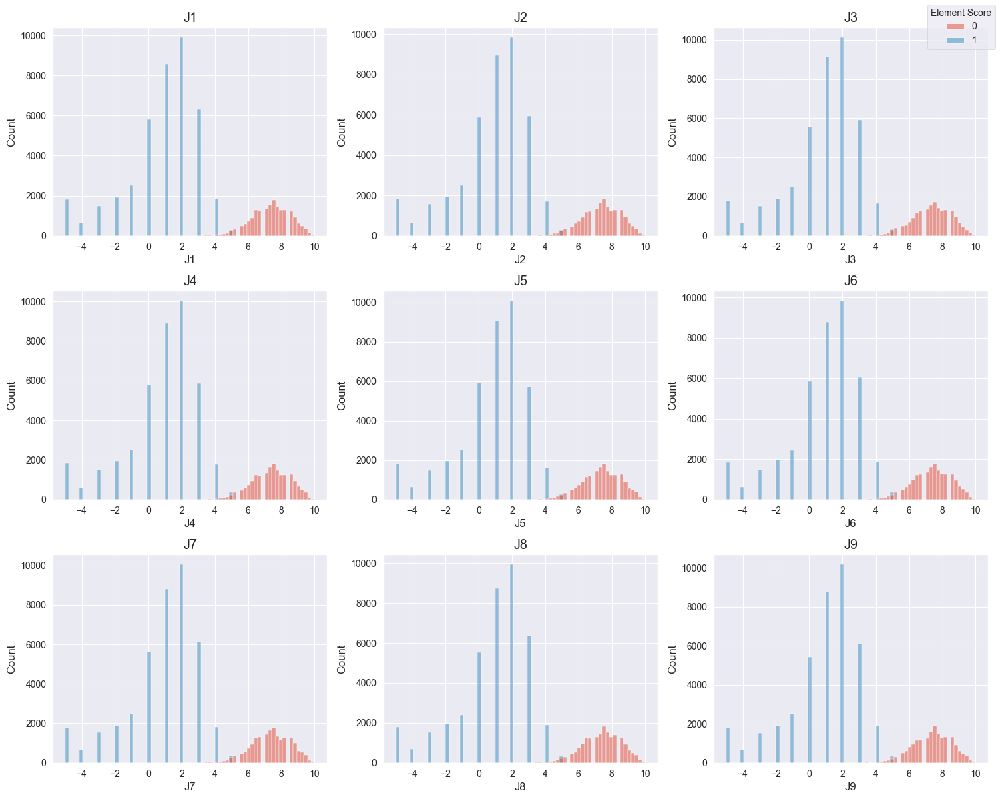

In [87]:
# why is judge col bimodal
n_cols = 3
n_plots = len(judge_cols)
n_rows = math.ceil(n_plots / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()

legend_data = None

for i, c in enumerate(judge_cols):
    sns.histplot(data=data_df, x=c, hue="is_element",bins =70, ax=axes[i])
    axes[i].set_title(c)
    
    # Capture the legend object from the first successful plot
    if legend_data is None and axes[i].get_legend():
        legend_obj = axes[i].get_legend()
        handles = legend_obj.legend_handles
        labels = [text.get_text() for text in legend_obj.get_texts()]
        legend_data = (handles, labels)
    
    # Remove individual legend
    if axes[i].get_legend():
        axes[i].get_legend().remove()

if legend_data:
    fig.legend(
        handles=legend_data[0],
        labels=legend_data[1],
        loc="upper right",
        title="Element Score"
    )

plt.tight_layout()
plt.show()


**Observations:**
- **Judge Scores** 
    - look relatively normal but bimodal suddenly
        - second hump is cause of element and program components; otherwise it all looks p normal
- **Extra Points**
    - most elements are not extra points
    - Question: How does # of extra point elements impact your score?
- **TSS/TES/TPCS**
    - Should remove one of these since they are clearly linear dependent (probably TSS)
    - ACTION: TES / TPCS feature? manually looking at score sheets, seems like people with high TES / TPCS tend to do better?
- **DEDUCTIONS**
    - Almost nobody gets a deduction
    - ACTION: Where in the program do deductions happen?
- **BASE VALUE**
    - Fat right tail
    - ACTION: Where are the high base value elements located in the program?
    - ACTION: How many high base value elements do people do?
    - ACTION: Base Value conditioned on rankings?
    - ACTION: Perhaps the people doing the super hard jumps are the people are way more talented. Does having a high base val mean that judges will score you higher on average?
        - ACTION: Maybe add total base val z-score feature? maybe ordinal ranking of total base val score?
- **GOE**
    - Thin tails, mostly clustered near 0
    - ACTION: How does GOE correlate with Base Value (presumably negative)?
    - ACTION: GOE conditioned on rankings?
- **FACTOR**
    - ACTION: idrk what this is yet 
    - DONE: seems like it is a thing to balance out the execution score and the performance component scores.
- **is_mens**
    - ACTION: Group by gender and see what patterns might appear; violin plot etc.
    - DONE: see below

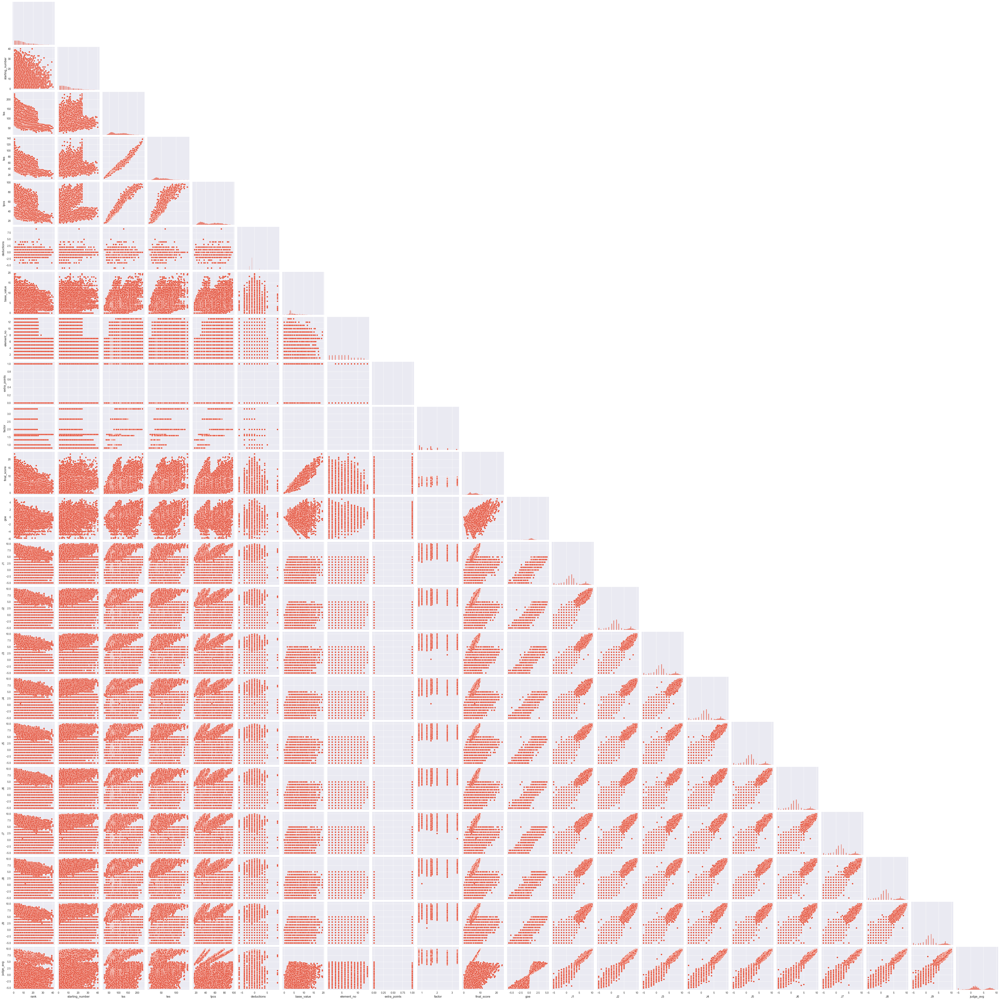

In [21]:
sns.pairplot(data_df[numeric_cols], corner=True)

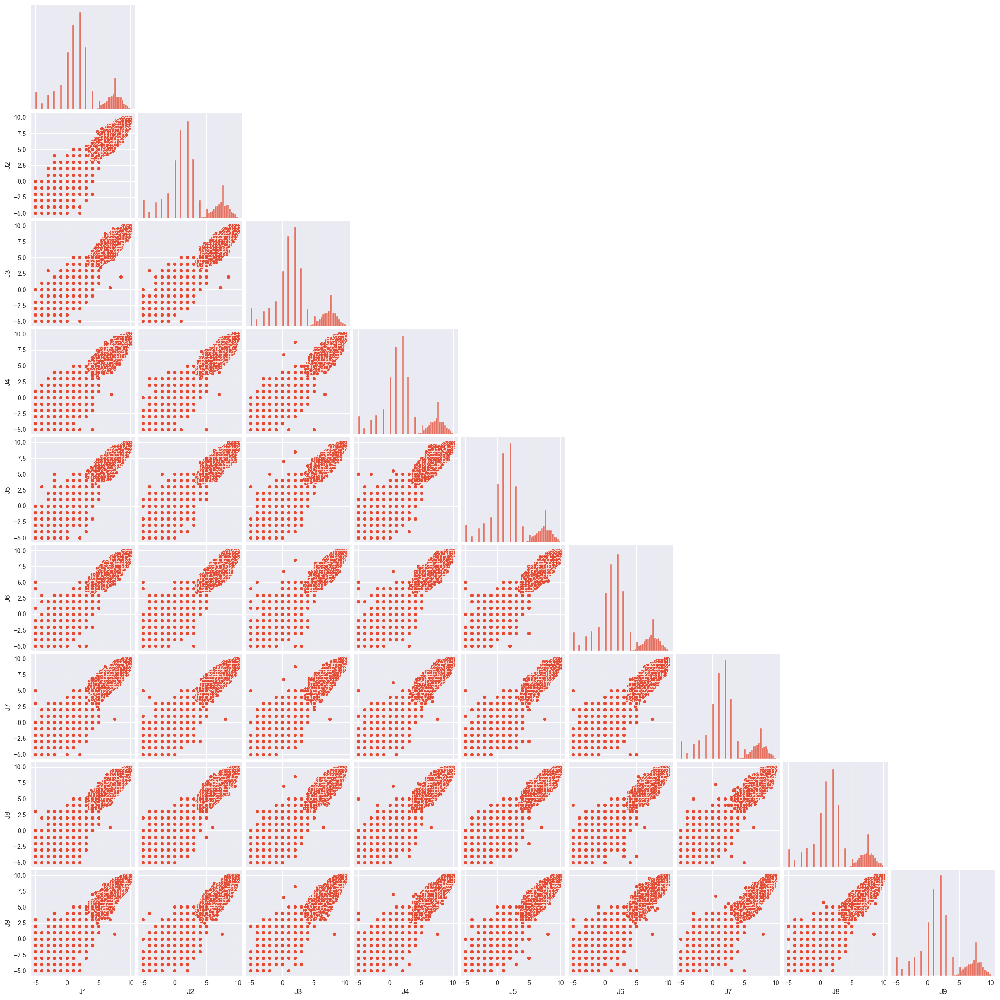

In [22]:
sns.pairplot(data_df[judge_cols], corner=True)
plt.show()

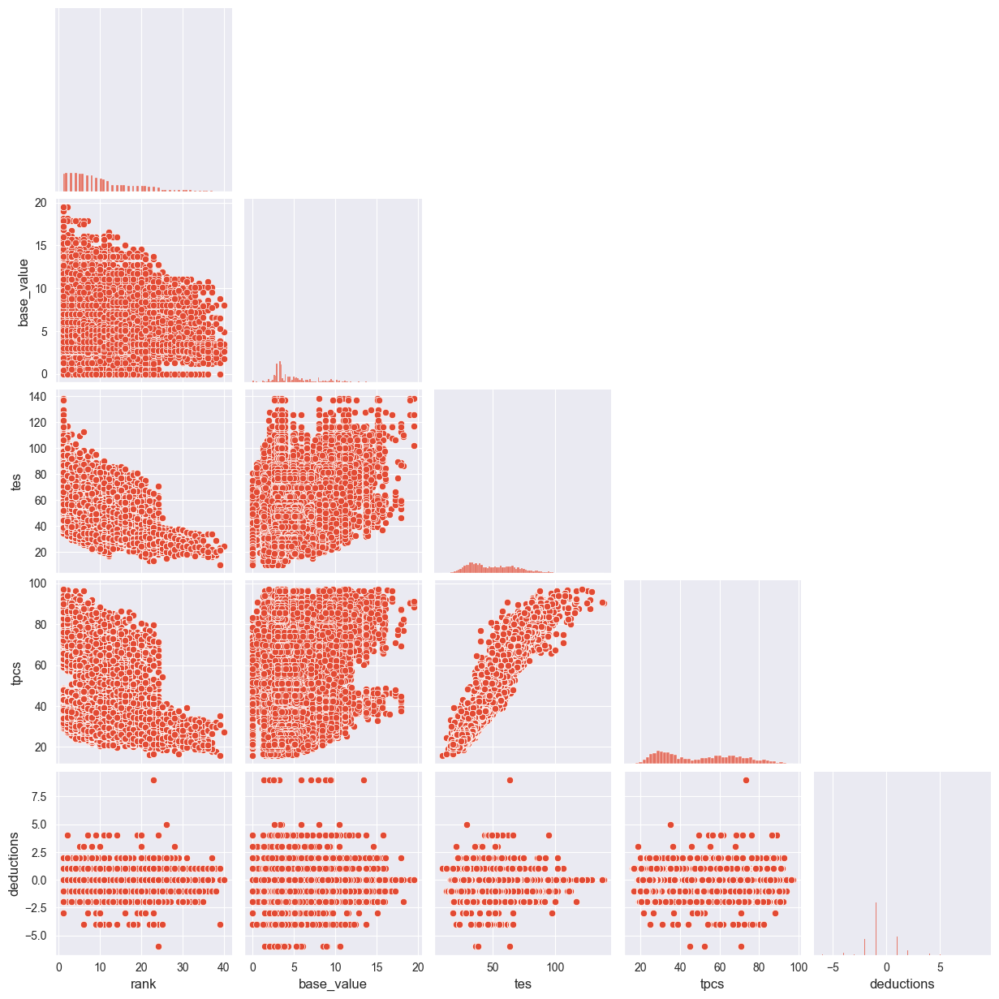

In [23]:
sns.pairplot(data_df[["rank", "base_value", "tes", "tpcs", "deductions"]], corner=True)
plt.show()

**Observations/Actions:**
- **Judge Scores**
    - Are the extra points are baked in already to the judge scores? (ACTION: violinplot comparing the distributions of is_extra)
    - Recalling the permutation trick, the fact that these all look the same makes more sense. They are all drawn from the same mixed distribution?
- **Base Val**
    - Band of base val when compared rank (everyone doing the basic stuff)
    - ACTION: new feature per person is like highest ranked base val component or something
- **TES**
    - Distinct Lines of TES/TPCS/TSS wrt rank
        - ACTION: my guess is that this is women vs men; off inspection top women scorers are scoring much less than top men scorers (DONE)

### Trying to See Nationality Bias

In [24]:
data_df.head()

,rank,name,noc,starting_number,tss,tes,tpcs,deductions,base_value,competition,element,element_no,extra_points,factor,final_score,goe,info,is_element,program_component,isu_year,J1,J2,J3,J4,J5,J6,J7,J8,J9,is_short_program,category,event_type,judge_avg,judge_name1,judge_nat1,judge_name2,judge_nat2,judge_name3,judge_nat3,judge_name4,judge_nat4,judge_name5,judge_nat5,judge_name6,judge_nat6,judge_name7,judge_nat7,judge_name8,judge_nat8,judge_name9,judge_nat9,judge_same1,judge_same2,judge_same3,judge_same4,judge_same5,judge_same6,judge_same7,judge_same8,judge_same9
0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,1,pairs,individual,3.0000,MORANDI Tiziana,ITA,HOWARD Karen,CAN,Anthony LEROY,FRA,GLENN Roger,USA,Andreas WALDECK,GER,BINDER Elisabeth,AUT,Jia YAO,CHN,JELINEK Lisa,AUS,BLANC Christine,SUI,0,0,0,0,1,0,0,0,0
1,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,4.4000,wc2018,3S,2.0000,0.0000,NaN,5.9000,1.5000,NaN,1,NaN,1718,2.0000,2.0000,3.0000,2.0000,3.0000,1.0000,1.0000,3.0000,2.0000,1,pairs,individual,2.1111,MORANDI Tiziana,ITA,HOWARD Karen,CAN,Anthony LEROY,FRA,GLENN Roger,USA,Andreas WALDECK,GER,BINDER Elisabeth,AUT,Jia YAO,CHN,JELINEK Lisa,AUS,BLANC Christine,SUI,0,0,0,0,1,0,0,0,0
2,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,5.5000,wc2018,3FTh,3.0000,0.0000,NaN,6.4000,0.9000,NaN,1,NaN,1718,2.0000,0.0000,1.0000,2.0000,3.0000,1.0000,0.0000,2.0000,1.0000,1,pairs,individual,1.3333,MORANDI Tiziana,ITA,HOWARD Karen,CAN,Anthony LEROY,FRA,GLENN Roger,USA,Andreas WALDECK,GER,BINDER Elisabeth,AUT,Jia YAO,CHN,JELINEK Lisa,AUS,BLANC Christine,SUI,0,0,0,0,1,0,0,0,0
3,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,4.5000,wc2018,3Li4,4.0000,0.0000,NaN,6.0000,1.5000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,2.0000,3.0000,3.0000,1,pairs,individual,2.8889,MORANDI Tiziana,ITA,HOWARD Karen,CAN,Anthony LEROY,FRA,GLENN Roger,USA,Andreas WALDECK,GER,BINDER Elisabeth,AUT,Jia YAO,CHN,JELINEK Lisa,AUS,BLANC Christine,SUI,0,0,0,0,1,0,0,0,0
4,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,3.9000,wc2018,StSq4,5.0000,0.0000,NaN,6.0000,2.1000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,1,pairs,individual,3.0000,MORANDI Tiziana,ITA,HOWARD Karen,CAN,Anthony LEROY,FRA,GLENN Roger,USA,Andreas WALDECK,GER,BINDER Elisabeth,AUT,Jia YAO,CHN,JELINEK Lisa,AUS,BLANC Christine,SUI,0,0,0,0,1,0,0,0,0


In [25]:
id_cols = [c for c in data_df.columns if not any(
    c.startswith(stub) for stub in ["J", "judge_same", "judge_nat"]
)]

long_data_df = (
    data_df
        .reset_index()
        .rename(columns={"index": "id"})
        .pipe(
            lambda x: pd.wide_to_long(
                x,
                stubnames=["J", "judge_same", "judge_nat"],
                i=["id"] + id_cols,
                j="num"
            )
        )
        .reset_index()
)

In [26]:
long_data_df.shape

(538560, 38)

In [27]:
data_df.shape

(59840, 60)

In [28]:
long_data_df.head()

,id,rank,name,noc,starting_number,tss,tes,tpcs,deductions,base_value,competition,element,element_no,extra_points,factor,final_score,goe,info,is_element,program_component,isu_year,is_short_program,category,event_type,judge_avg,judge_name1,judge_name2,judge_name3,judge_name4,judge_name5,judge_name6,judge_name7,judge_name8,judge_name9,num,J,judge_same,judge_nat
0,0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,1,pairs,individual,3.0000,MORANDI Tiziana,HOWARD Karen,Anthony LEROY,GLENN Roger,Andreas WALDECK,BINDER Elisabeth,Jia YAO,JELINEK Lisa,BLANC Christine,1,3.0000,0,ITA
1,0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,1,pairs,individual,3.0000,MORANDI Tiziana,HOWARD Karen,Anthony LEROY,GLENN Roger,Andreas WALDECK,BINDER Elisabeth,Jia YAO,JELINEK Lisa,BLANC Christine,2,3.0000,0,CAN
2,0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,1,pairs,individual,3.0000,MORANDI Tiziana,HOWARD Karen,Anthony LEROY,GLENN Roger,Andreas WALDECK,BINDER Elisabeth,Jia YAO,JELINEK Lisa,BLANC Christine,3,3.0000,0,FRA
3,0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,1,pairs,individual,3.0000,MORANDI Tiziana,HOWARD Karen,Anthony LEROY,GLENN Roger,Andreas WALDECK,BINDER Elisabeth,Jia YAO,JELINEK Lisa,BLANC Christine,4,3.0000,0,USA
4,0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,1,pairs,individual,3.0000,MORANDI Tiziana,HOWARD Karen,Anthony LEROY,GLENN Roger,Andreas WALDECK,BINDER Elisabeth,Jia YAO,JELINEK Lisa,BLANC Christine,5,3.0000,1,GER


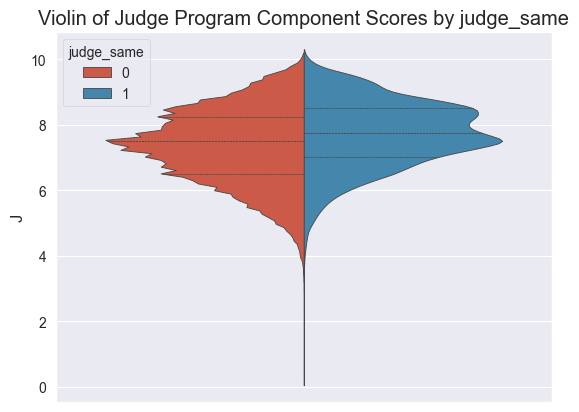

In [95]:
(
    sns.violinplot(
        y="J",
        hue="judge_same",
        data=long_data_df[lambda x:  x.is_element == 0],
        split=True,
        inner="quartile",
    )
    .set(title="Violin of Judge Program Component Scores by judge_same")
)
plt.show()

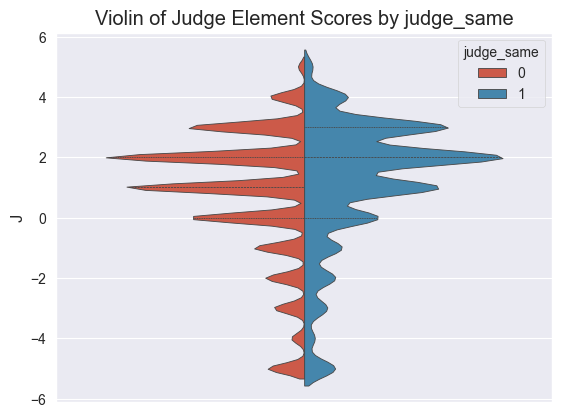

In [96]:
(
    sns.violinplot(
        y="J",
        hue="judge_same",
        data=long_data_df[lambda x:  x.is_element == 1],
        split=True,
        inner="quartile",
    )
    .set(title="Violin of Judge Element Scores by judge_same")
)
plt.show()

### Correlations across Elements and PCs

In [31]:
judge_cols

['J1', 'J2', 'J3', 'J4', 'J5', 'J6', 'J7', 'J8', 'J9']

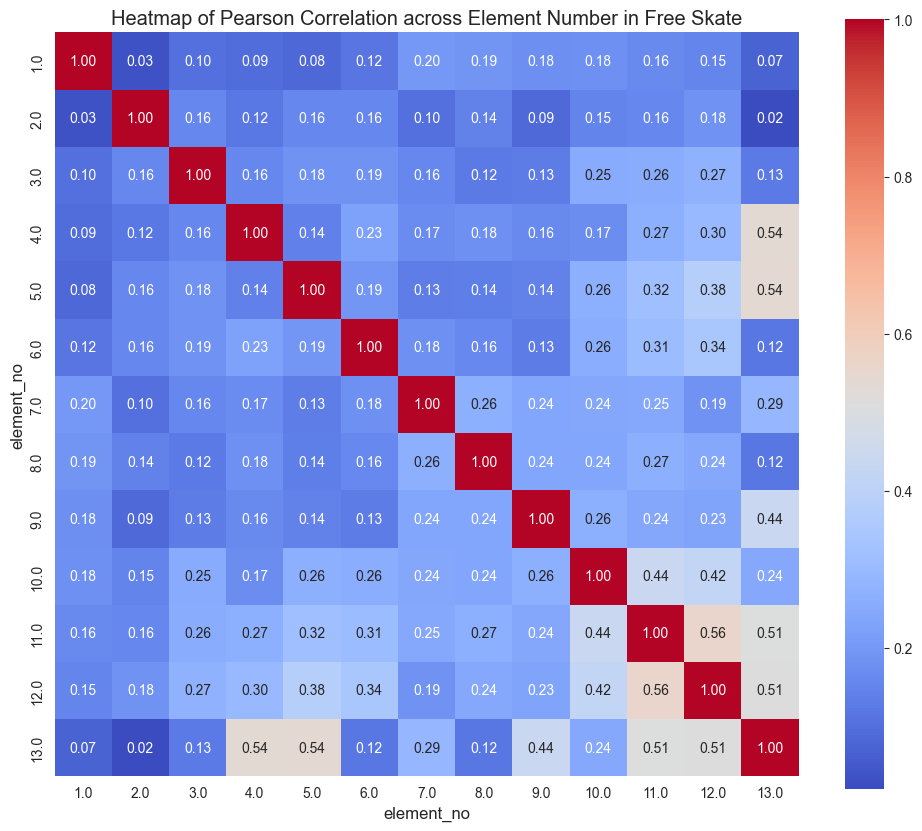

In [88]:
fs_elements_corr = (
    data_df
        [lambda x: (x.is_element == 1) & (x.is_short_program == 0)]
        .set_index(["name", "competition", "category", "event_type"])
        [["element_no", "judge_avg"] + judge_cols]
        .drop(columns=judge_cols)
        .reset_index()
        .pivot(
            index=["name", "competition",  "category", "event_type"],
            columns="element_no",
            values="judge_avg"
        )
)

plt.figure(figsize=(12, 10))
sns.heatmap(fs_elements_corr.corr(), annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Heatmap of Pearson Correlation across Element Number in Free Skate")
plt.show()

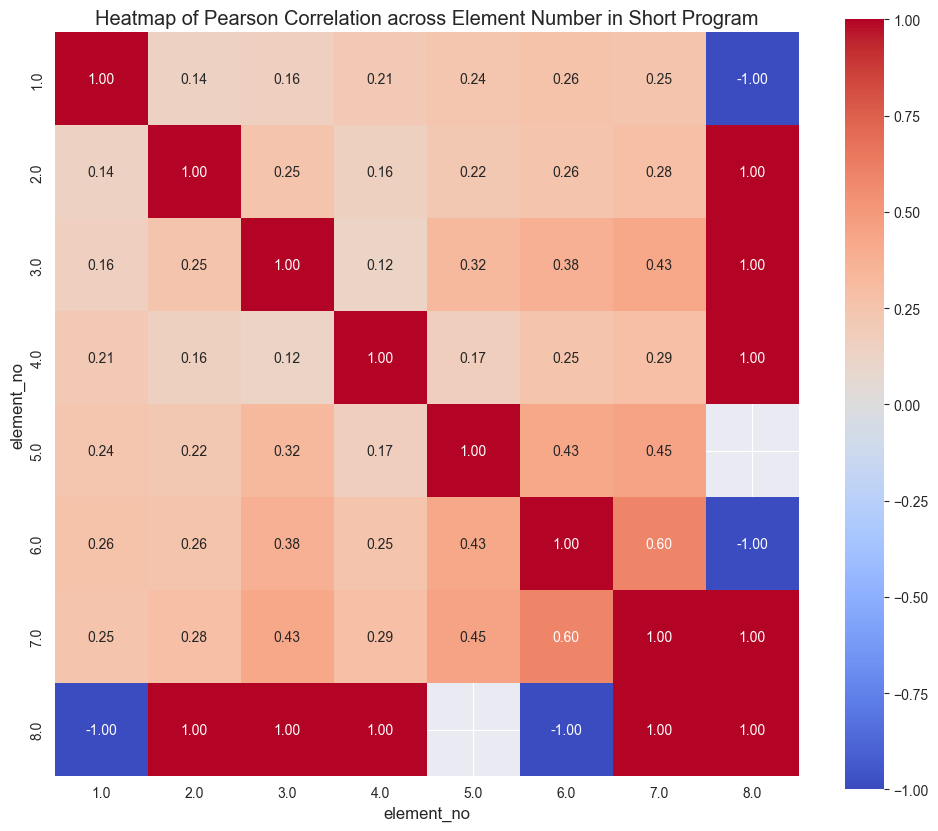

In [89]:
short_element_corr = (
    data_df
        [lambda x: (x.is_element == 1) & (x.is_short_program == 1)]
        .set_index(["name", "competition", "category", "event_type"])
        [["element_no", "judge_avg"] + judge_cols]
        .drop(columns=judge_cols)
        .reset_index()
        .pivot(
            index=["name", "competition",  "category", "event_type"],
            columns="element_no",
            values="judge_avg"
        )
)

plt.figure(figsize=(12, 10))
sns.heatmap(short_element_corr.corr(), annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Heatmap of Pearson Correlation across Element Number in Short Program")
plt.show()

In [93]:
short_element_corr[lambda x: ~x[8.0].isna()]

,,,element_no,1.0000,2.0000,3.0000,4.0000,5.0000,6.0000,7.0000,8.0000
name,competition,category,event_type,,,,,,,,
Kevin Reynolds,gpusa2017,men,individual,-1.5556,0.4444,0.0000,0.7778,NaN,-0.7778,0.8889,1.1111
Mark Webster,fc2018,men,individual,-0.6667,-3.0000,-0.2222,0.0000,-0.7778,0.3333,0.1111,0.0000


In [34]:
data_df[lambda x: (x.element_no == 8) & (x.is_short_program == 1)]

,rank,name,noc,starting_number,tss,tes,tpcs,deductions,base_value,competition,element,element_no,extra_points,factor,final_score,goe,info,is_element,program_component,isu_year,J1,J2,J3,J4,J5,J6,J7,J8,J9,is_short_program,category,event_type,judge_avg,judge_name1,judge_nat1,judge_name2,judge_nat2,judge_name3,judge_nat3,judge_name4,judge_nat4,judge_name5,judge_nat5,judge_name6,judge_nat6,judge_name7,judge_nat7,judge_name8,judge_nat8,judge_name9,judge_nat9,judge_same1,judge_same2,judge_same3,judge_same4,judge_same5,judge_same6,judge_same7,judge_same8,judge_same9
35662,28,Mark Webster,AUS,14,49.4500,21.3800,29.0700,1.0000,0.0000,fc2018,3F*+2T*,8.0000,0.0000,NaN,0.0000,0.0000,*,1,NaN,1718,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1,men,individual,0.0000,KEEN Leslie,CAN,GRAHAM Peggy,USA,Angelique CLYDE-SMITH,AUS,KUBOTA Masako,JPN,CHEN Weiguang,CHN,AHN Na Young,KOR,Magdalena RUSIECKA,POL,GUSKOV Yuri,KAZ,NUMANOVA Saodat,UZB,0,0,1,0,0,0,0,0,0
49154,10,Kevin Reynolds,CAN,5,69.1000,32.7500,36.3500,0.0000,3.5000,gpusa2017,CCoSp4,8.0000,0.0000,NaN,4.0700,0.5700,NaN,1,NaN,1718,1.0000,0.0000,1.0000,1.0000,1.0000,2.0000,1.0000,2.0000,1.0000,1,men,individual,1.1111,Alexei BELETSKI,ISR,an so young,KOR,CHEN Weiguang,CHN,Elke TREITZ,GER,KUNO Yoko,JPN,martinez sasha,MEX,BABENKO Sviatoslav,RUS,ENZMANN Wendy,USA,ABBOTT Jodi,CAN,0,0,0,0,0,0,0,0,1


Mark Webster had 8 cause he repeated a jump I think

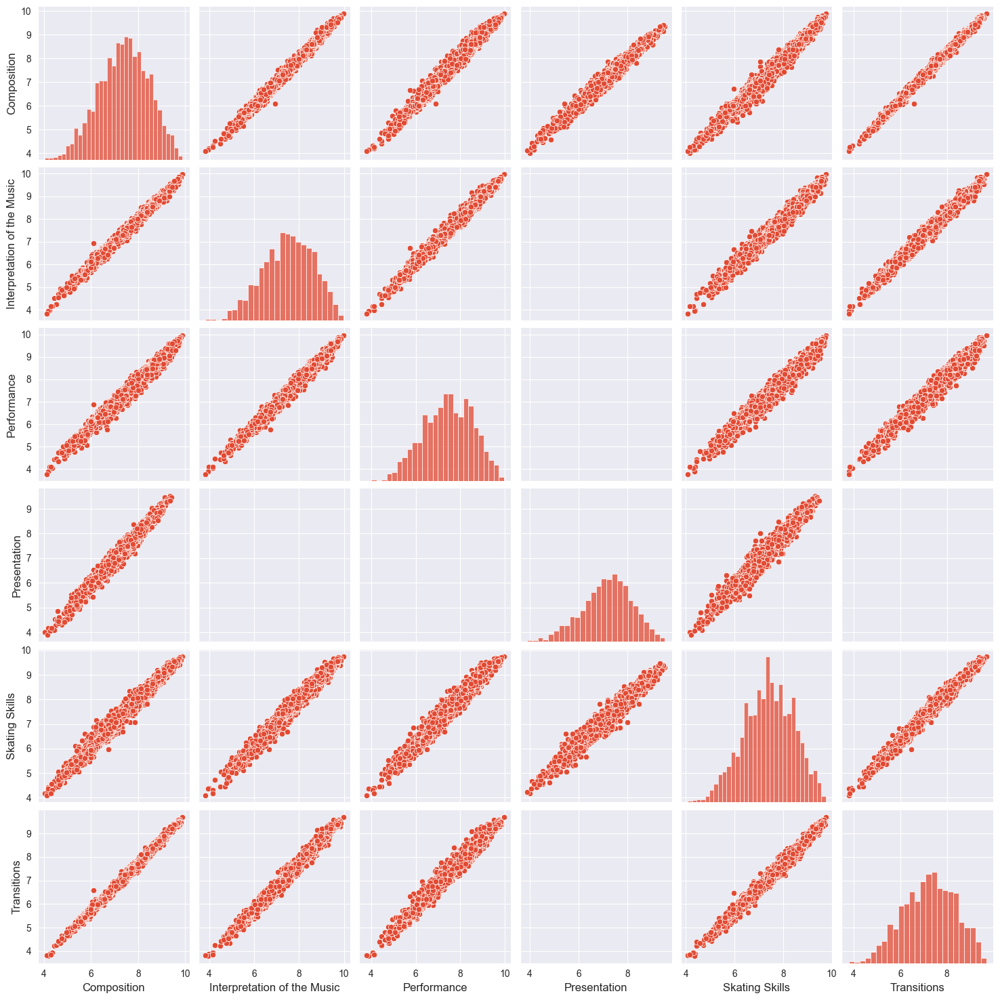

In [35]:
pc_corr = (
    data_df
        [lambda x: (x.is_element == 0)]
        .set_index(["name", "competition","is_short_program", "category", "event_type"])
        [["program_component", "judge_avg"] + judge_cols]
        .drop(columns=judge_cols)
        .reset_index()
        .pivot(
            index=["name", "competition", "is_short_program", "category", "event_type"],
            columns="program_component",
            values="judge_avg"
        )
        # .corr()
)
sns.pairplot(pc_corr)

In [36]:
pc_corr

program_component                                                                  Composition  \
name                             competition is_short_program category event_type                
Abzal Rakimgaliev                fc2018      0                men      individual       5.6944   
                                             1                men      individual       5.9444   
                                 wc2018      1                men      individual       6.3056   
Adam Hagara                      ec2022      1                men      individual       6.3056   
                                 ec2023      0                men      individual       5.5556   
...                                                                                        ...   
Zoe Jones / Christopher Boyadji  wc2021      1                pairs    individual       5.5556   
                                 wc2022      0                pairs    individual       6.0556   
                                             1                pairs    individual       6.0000   
Zukova Jelizaveta / Bidar Martin owg2022     1                pairs    individual       6.9722   
                                                                       team             7.0556   

program_component                                                                  Interpretation of the Music  \
name                             competition is_short_program category event_type                                
Abzal Rakimgaliev                fc2018      0                men      individual                       5.5556   
                                             1                men      individual                       5.8333   
                                 wc2018      1                men      individual                       6.4722   
Adam Hagara                      ec2022      1                men      individual                       6.1944   
                                 ec2023      0                men      individual                          NaN   
...                                                                                                        ...   
Zoe Jones / Christopher Boyadji  wc2021      1                pairs    individual                       5.3056   
                                 wc2022      0                pairs    individual                       6.0278   
                                             1                pairs    individual                       6.1389   
Zukova Jelizaveta / Bidar Martin owg2022     1                pairs    individual                       6.7222   
                                                                       team                             7.1111   

program_component                                                                  Performance  \
name                             competition is_short_program category event_type                
Abzal Rakimgaliev                fc2018      0                men      individual       5.6944   
                                             1                men      individual       5.7500   
                                 wc2018      1                men      individual       6.3056   
Adam Hagara                      ec2022      1                men      individual       6.2222   
                                 ec2023      0                men      individual          NaN   
...                                                                                        ...   
Zoe Jones / Christopher Boyadji  wc2021      1                pairs    individual       5.2500   
                                 wc2022      0                pairs    individual       6.0278   
                                             1                pairs    individual       6.1389   
Zukova Jelizaveta / Bidar Martin owg2022     1                pairs    individual       6.5556   
                                                                  

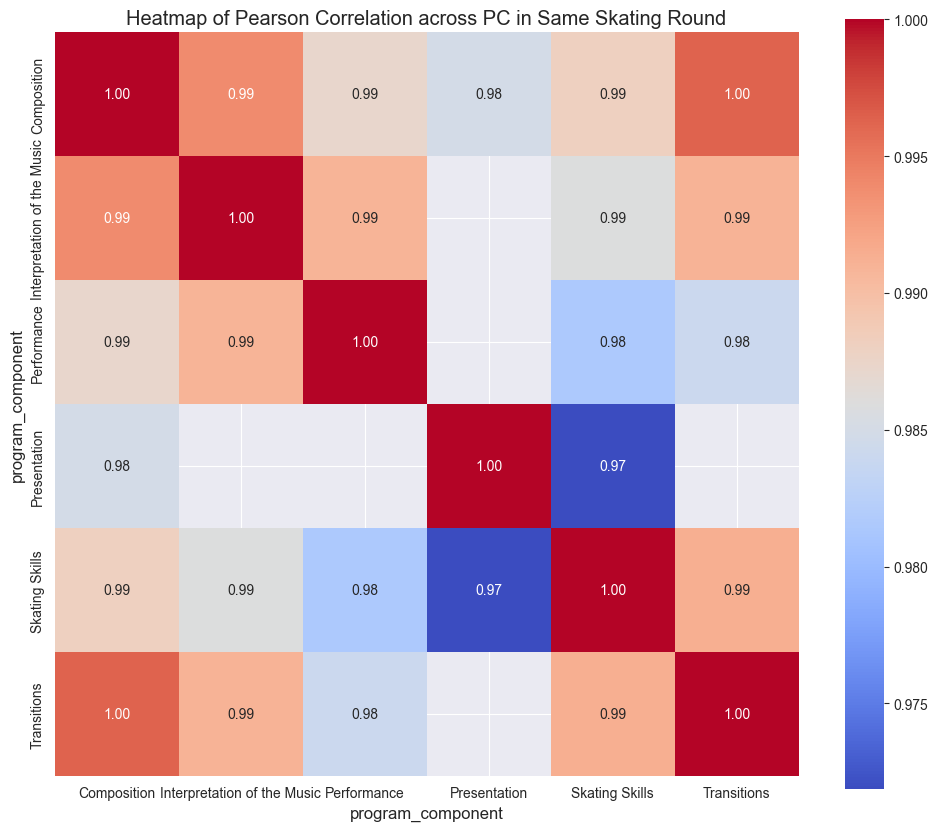

In [37]:
plt.figure(figsize=(12, 10))
sns.heatmap(pc_corr.corr(), annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Heatmap of Pearson Correlation across PC in Same Skating Round")
plt.show()

<Axes: xlabel='Skating Skills', ylabel='Interpretation of the Music'>

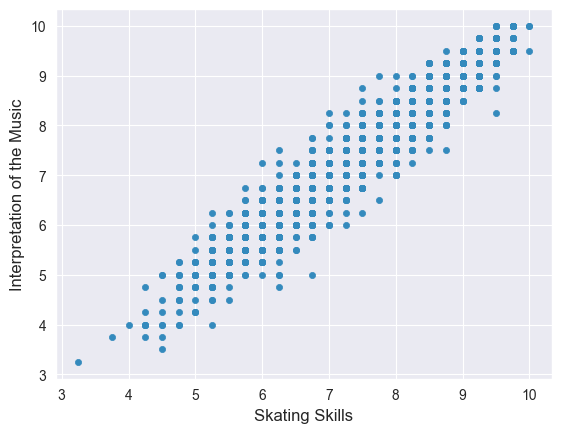

In [38]:
c1 = "Skating Skills"
c2 = "Interpretation of the Music"
(
    data_df
        [
            lambda x: (x.is_element == 0) 
                    & (
                        (x.program_component == c1) 
                        | (x.program_component == c2)
                      )
        ]
        [["name", "competition","is_short_program", "category", "event_type", "program_component", "J1"]]
        .pivot(
            index=["name", "competition", "is_short_program", "category", "event_type"],
            columns="program_component",
            values="J1"
        )
        .plot.scatter(x=c1, y=c2)
)

### Base Val

In [ ]:
sns.scatterplot(data=data_df, x="rank", y="base_value", hue="category")
plt.show()

### TES

In [ ]:
# in tss vs rank plot, the lines are distinct
sns.scatterplot(data=data_df, x="rank", y="tss", hue="category")
plt.show()

# distinct lines are due to gender and due to free vs short program
sns.scatterplot(data=data_df, x="rank", y="tss", hue="is_short_program")
plt.show()

sns.scatterplot(data=data_df, x="rank", y="tss", hue="isu_year")
plt.show()

Intuitively this should make sense that the free skate is much higher is score; it literally is longer.

### Gender Split

In [ ]:
n_cols = 3
n_plots = len(numeric_cols)
n_rows = math.ceil(n_plots / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()  # make indexing easy

for i, c in enumerate(numeric_cols):
    sns.violinplot(
        y=c,
        hue="category",
        data=data_df,
        split=True,
        inner="quartile",
        palette="Set2",
        ax=axes[i]
    )
    axes[i].set_title(c)
    axes[i].legend_.remove()  # remove repeated legends

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add one shared legend
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper right")

plt.tight_layout()
plt.show()


### Short Program Split

In [ ]:
n_cols = 3
n_plots = len(numeric_cols)
n_rows = math.ceil(n_plots / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()  # make indexing easy

for i, c in enumerate(numeric_cols):
    sns.violinplot(
        y=c,
        hue="is_short_program",
        data=data_df,
        split=True,
        inner="quartile",
        palette="Set2",
        ax=axes[i]
    )
    axes[i].set_title(c)
    axes[i].legend_.remove()  # remove repeated legends

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add one shared legend
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper right")

plt.tight_layout()
plt.show()


### Extra Points Split

In [ ]:
n_cols = 3
n_plots = len(numeric_cols)
n_rows = math.ceil(n_plots / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()  # make indexing easy

for i, c in enumerate(numeric_cols):
    sns.violinplot(
        y=c,
        hue="extra_points",
        data=data_df,
        split=True,
        inner="quartile",
        palette="Set2",
        ax=axes[i]
    )
    axes[i].set_title(c)
    axes[i].legend_.remove()  # remove repeated legends

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add one shared legend
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper right")

plt.tight_layout()
plt.show()


### Final Score

In [ ]:
pairplot_list_against_list(data_df, numeric_cols, ["final_score"])

## Categorical Variables

### Number of Datapoints per Judge

In [39]:
judge_count_df = (
    data_df
        .groupby(["name", "competition", "is_short_program", "category", "event_type"])
        .agg({f"judge_name{i}" : "first" for i in range(1,10)})
        .reset_index()
        .pipe(
            lambda x: pd.melt(
                x,
                id_vars=["name", "competition", "is_short_program", "category", "event_type"],
                value_vars=[f"judge_name{i}" for i in range(1, 10)],
                var_name="judge_num",
                value_name="judge_name"
            )
        )
)
judge_count_df.head()

,name,competition,is_short_program,category,event_type,judge_num,judge_name
0,Abzal Rakimgaliev,fc2018,0,men,individual,judge_name1,GUSKOV Yuri
1,Abzal Rakimgaliev,fc2018,1,men,individual,judge_name1,KEEN Leslie
2,Abzal Rakimgaliev,wc2018,1,men,individual,judge_name1,Anna SIEROCKA
3,Adam Hagara,ec2022,1,men,individual,judge_name1,POPOVA Vessela
4,Adam Hagara,ec2023,0,men,individual,judge_name1,STAHL Ursula


In [40]:
judge_count_df["judge_name"].value_counts()

judge_name
ABELE Agita                            765
Anna KANTOR                            618
CHIGOGIDZE Salome                      530
DE Francoise RAPPARD                   519
Kadi ZVIRIK                            468
Anthony LEROY                          456
KULIK Zanna                            445
KOZHEMYAKINA Olga                      439
Jung LEE Sue                           435
Marta OLOZAGARRE                       424
Florence VUYLSTEKER                    402
KLIUSHNIKOV Yury                       377
VIKARNE-HOMOLYA Zsuzsanna              361
Nadezhda PARETSKAIA                    345
Nobuhiko YOSHIOKA                      343
an so young                            340
martinez sasha                         338
Elena FOMINA                           332
KUBOTA Masako                          319
HORIUCHI Ritsuko                       318
NUMANOVA Saodat                        318
Ariadna MORONES NEGRETE                311
Kevin ROSENSTEIN                       310


In [41]:
judge_count_df["judge_name"].value_counts().shape

(312,)

In [42]:
final_judge_study_names_df = judge_count_df["judge_name"].value_counts().reset_index()[lambda x: x["count"] >= 30]

In [43]:
final_judge_study_names_df.shape

(289, 2)

# Interesting Questions

1. Controlling for skill or something like that, is it +ev to do lots of extra jumps and have your hardest jumps be extra points?
2. Do judges grade skilled skaters more favorablely?
3. Do judges grade "easy" elements all the same and then "hard" elements are the differentiating factor? (smth smth variance of so-called easy jumps vs variance of so-called hard jumps?)
4. Reproducing similar study questions like which judges are being dropped, trying to identify judges across the permutations

# Modeling

In [44]:
data_df.head(3)

,rank,name,noc,starting_number,tss,tes,tpcs,deductions,base_value,competition,element,element_no,extra_points,factor,final_score,goe,info,is_element,program_component,isu_year,J1,J2,J3,J4,J5,J6,J7,J8,J9,is_short_program,category,event_type,judge_avg,judge_name1,judge_nat1,judge_name2,judge_nat2,judge_name3,judge_nat3,judge_name4,judge_nat4,judge_name5,judge_nat5,judge_name6,judge_nat6,judge_name7,judge_nat7,judge_name8,judge_nat8,judge_name9,judge_nat9,judge_same1,judge_same2,judge_same3,judge_same4,judge_same5,judge_same6,judge_same7,judge_same8,judge_same9
0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,1,pairs,individual,3.0000,MORANDI Tiziana,ITA,HOWARD Karen,CAN,Anthony LEROY,FRA,GLENN Roger,USA,Andreas WALDECK,GER,BINDER Elisabeth,AUT,Jia YAO,CHN,JELINEK Lisa,AUS,BLANC Christine,SUI,0,0,0,0,1,0,0,0,0
1,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,4.4000,wc2018,3S,2.0000,0.0000,NaN,5.9000,1.5000,NaN,1,NaN,1718,2.0000,2.0000,3.0000,2.0000,3.0000,1.0000,1.0000,3.0000,2.0000,1,pairs,individual,2.1111,MORANDI Tiziana,ITA,HOWARD Karen,CAN,Anthony LEROY,FRA,GLENN Roger,USA,Andreas WALDECK,GER,BINDER Elisabeth,AUT,Jia YAO,CHN,JELINEK Lisa,AUS,BLANC Christine,SUI,0,0,0,0,1,0,0,0,0
2,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,5.5000,wc2018,3FTh,3.0000,0.0000,NaN,6.4000,0.9000,NaN,1,NaN,1718,2.0000,0.0000,1.0000,2.0000,3.0000,1.0000,0.0000,2.0000,1.0000,1,pairs,individual,1.3333,MORANDI Tiziana,ITA,HOWARD Karen,CAN,Anthony LEROY,FRA,GLENN Roger,USA,Andreas WALDECK,GER,BINDER Elisabeth,AUT,Jia YAO,CHN,JELINEK Lisa,AUS,BLANC Christine,SUI,0,0,0,0,1,0,0,0,0


**Observation/Action**
- The errors on ees and pcs are correlated within a performance obviously, and also probably between short and free program for same skater.
- To avoid doing some clustered errors or smth like that, we are going to create an estimate for the overall TSS that a judge's scoring implies.
    - The estimate is constructed as follows: 
        - sum(base_val) + sum_(factor * judge_score)
    - For ee's, set factor to be 1 so that the above sum equals:
        - sum(base val) + sum(ee) + sum(factor * pc)

### Constructing mock "TSS" Score

In [45]:
agg_df = (
    data_df
        .groupby(["name", "noc", "isu_year", "competition", "is_short_program", "category", "event_type", "is_element"])
        .agg(
            {f"J{i}" : "sum" for i in range(1,10)} |
            {f"judge_name{i}" : "first" for i in range(1,10)} |
            {f"judge_nat{i}" : "first" for i in range(1,10)} |
            {f"judge_same{i}" : "first" for i in range(1,10)} | 
            {
                "base_value" : "sum",
                "factor" : "first"
            }
        )
        .fillna(
            {
                "factor" : 1,
                "base_value" : 0
            }
        )
        .reset_index()       
)

for i in range(1, 10):
    agg_df[f"J_final{i}"] = (agg_df[f"J{i}"]* agg_df["factor"] + agg_df["base_value"]) 


In [46]:
agg_df.head()

,name,noc,isu_year,competition,is_short_program,category,event_type,is_element,J1,J2,J3,J4,J5,J6,J7,J8,J9,judge_name1,judge_name2,judge_name3,judge_name4,judge_name5,judge_name6,judge_name7,judge_name8,judge_name9,judge_nat1,judge_nat2,judge_nat3,judge_nat4,judge_nat5,judge_nat6,judge_nat7,judge_nat8,judge_nat9,judge_same1,judge_same2,judge_same3,judge_same4,judge_same5,judge_same6,judge_same7,judge_same8,judge_same9,base_value,factor,J_final1,J_final2,J_final3,J_final4,J_final5,J_final6,J_final7,J_final8,J_final9
0,Abzal Rakimgaliev,KAZ,1718,fc2018,0,men,individual,0,31.7500,27.7500,27.2500,28.7500,26.5000,27.7500,29.5000,25.2500,29.5000,GUSKOV Yuri,AHN Na Young,Angelique CLYDE-SMITH,Magdalena RUSIECKA,KUBOTA Masako,KEEN Leslie,NUMANOVA Saodat,GRAHAM Peggy,CHEN Weiguang,KAZ,KOR,AUS,POL,JPN,CAN,UZB,USA,CHN,1,0,0,0,0,0,0,0,0,0.0000,2.0000,63.5000,55.5000,54.5000,57.5000,53.0000,55.5000,59.0000,50.5000,59.0000
1,Abzal Rakimgaliev,KAZ,1718,fc2018,0,men,individual,1,-2.0000,-5.0000,-12.0000,-13.0000,-15.0000,-13.0000,-9.0000,-10.0000,-11.0000,GUSKOV Yuri,AHN Na Young,Angelique CLYDE-SMITH,Magdalena RUSIECKA,KUBOTA Masako,KEEN Leslie,NUMANOVA Saodat,GRAHAM Peggy,CHEN Weiguang,KAZ,KOR,AUS,POL,JPN,CAN,UZB,USA,CHN,1,0,0,0,0,0,0,0,0,68.0000,1.0000,66.0000,63.0000,56.0000,55.0000,53.0000,55.0000,59.0000,58.0000,57.0000
2,Abzal Rakimgaliev,KAZ,1718,fc2018,1,men,individual,0,25.7500,27.2500,27.0000,28.0000,30.7500,30.0000,30.0000,33.2500,29.2500,KEEN Leslie,GRAHAM Peggy,Angelique CLYDE-SMITH,KUBOTA Masako,CHEN Weiguang,AHN Na Young,Magdalena RUSIECKA,GUSKOV Yuri,NUMANOVA Saodat,CAN,USA,AUS,JPN,CHN,KOR,POL,KAZ,UZB,0,0,0,0,0,0,0,1,0,0.0000,1.0000,25.7500,27.2500,27.0000,28.0000,30.7500,30.0000,30.0000,33.2500,29.2500
3,Abzal Rakimgaliev,KAZ,1718,fc2018,1,men,individual,1,-7.0000,-6.0000,-7.0000,-7.0000,-6.0000,-6.0000,-4.0000,-3.0000,-5.0000,KEEN Leslie,GRAHAM Peggy,Angelique CLYDE-SMITH,KUBOTA Masako,CHEN Weiguang,AHN Na Young,Magdalena RUSIECKA,GUSKOV Yuri,NUMANOVA Saodat,CAN,USA,AUS,JPN,CHN,KOR,POL,KAZ,UZB,0,0,0,0,0,0,0,1,0,36.7400,1.0000,29.7400,30.7400,29.7400,29.7400,30.7400,30.7400,32.7400,33.7400,31.7400
4,Abzal Rakimgaliev,KAZ,1718,wc2018,1,men,individual,0,29.2500,29.2500,30.2500,28.0000,35.5000,29.2500,31.0000,32.2500,37.5000,Anna SIEROCKA,SHI Wei,AMAKO Kenji,NUMANOVA Saodat,RISTANEN Tarja,Anna KANTOR,BLATZ Susan,Igor OBRAZTSOV,Peter RANKIN,POL,CHN,JPN,UZB,FIN,ISR,CAN,RUS,AUS,0,0,0,0,0,0,0,0,0,0.0000,1.0000,29.2500,29.2500,30.2500,28.0000,35.5000,29.2500,31.0000,32.2500,37.5000


In [47]:
agg_df.shape

(8962, 55)

In [48]:
data_df.shape

(59840, 60)

In [49]:
df = (
    agg_df
        .groupby(["name","noc", "isu_year", "competition", "is_short_program", "category", "event_type"])
        .agg(
            {f"J_final{i}" : "sum" for i in range(1,10)} |
            {f"judge_name{i}" : "first" for i in range(1,10)} |
            {f"judge_nat{i}" : "first" for i in range(1,10)} |
            {f"judge_same{i}" : "first" for i in range(1,10)}
        )
        .assign(
            judge_avg_final = lambda x: x[[f"J_final{i}" for i in range(1,10)]].mean(axis=1)
        )
        .reset_index()
)
df.head()

,name,noc,isu_year,competition,is_short_program,category,event_type,J_final1,J_final2,J_final3,J_final4,J_final5,J_final6,J_final7,J_final8,J_final9,judge_name1,judge_name2,judge_name3,judge_name4,judge_name5,judge_name6,judge_name7,judge_name8,judge_name9,judge_nat1,judge_nat2,judge_nat3,judge_nat4,judge_nat5,judge_nat6,judge_nat7,judge_nat8,judge_nat9,judge_same1,judge_same2,judge_same3,judge_same4,judge_same5,judge_same6,judge_same7,judge_same8,judge_same9,judge_avg_final
0,Abzal Rakimgaliev,KAZ,1718,fc2018,0,men,individual,129.5000,118.5000,110.5000,112.5000,106.0000,110.5000,118.0000,108.5000,116.0000,GUSKOV Yuri,AHN Na Young,Angelique CLYDE-SMITH,Magdalena RUSIECKA,KUBOTA Masako,KEEN Leslie,NUMANOVA Saodat,GRAHAM Peggy,CHEN Weiguang,KAZ,KOR,AUS,POL,JPN,CAN,UZB,USA,CHN,1,0,0,0,0,0,0,0,0,114.4444
1,Abzal Rakimgaliev,KAZ,1718,fc2018,1,men,individual,55.4900,57.9900,56.7400,57.7400,61.4900,60.7400,62.7400,66.9900,60.9900,KEEN Leslie,GRAHAM Peggy,Angelique CLYDE-SMITH,KUBOTA Masako,CHEN Weiguang,AHN Na Young,Magdalena RUSIECKA,GUSKOV Yuri,NUMANOVA Saodat,CAN,USA,AUS,JPN,CHN,KOR,POL,KAZ,UZB,0,0,0,0,0,0,0,1,0,60.1011
2,Abzal Rakimgaliev,KAZ,1718,wc2018,1,men,individual,57.8800,55.8800,58.8800,60.6300,69.1300,57.8800,59.6300,62.8800,72.1300,Anna SIEROCKA,SHI Wei,AMAKO Kenji,NUMANOVA Saodat,RISTANEN Tarja,Anna KANTOR,BLATZ Susan,Igor OBRAZTSOV,Peter RANKIN,POL,CHN,JPN,UZB,FIN,ISR,CAN,RUS,AUS,0,0,0,0,0,0,0,0,0,61.6578
3,Adam Hagara,SVK,2122,ec2022,1,men,individual,67.0800,68.5800,64.5800,61.5800,65.3300,72.3300,62.0800,66.5800,69.5800,POPOVA Vessela,ANILDI Ebru,Jitka MOKRA,CHAPMAN Mary,KLIUSHNIKOV Yury,SHARKINA Tatiana,Ekaterina SEROVA,Elisabeth LOUESDON,Edith SCHILLER,BUL,TUR,CZE,GBR,AZE,RUS,BLR,FRA,AUT,0,0,0,0,0,0,0,0,0,66.4133
4,Adam Hagara,SVK,2122,wc2022,1,men,individual,68.0100,61.2600,58.5100,57.5100,61.7600,64.0100,61.5100,62.5100,53.2600,guskov yuriy,ANILDI Ebru,BILLOW Emilie,Katharina RAUCH,Kadi ZVIRIK,KLIUSHNIKOV Yury,MERIGUET Philippe,CAVELLI Daniela,Deborah ISLAM,KAZ,TUR,SWE,AUT,EST,AZE,FRA,ITA,CAN,0,0,0,0,0,0,0,0,0,60.9267


In [50]:
df.shape

(4481, 44)

### Constructing Regression DF

In [51]:
dfs = []
for i in range(1,10):
    temp = pd.DataFrame()
    specific_judge_col = f"J_final{i}"
    specific_judge_name = f"judge_name{i}"
    specific_judge_nat = f"judge_nat{i}"
    specific_judge_same = f"judge_same{i}"
    temp["specific_judge_score"] = df[specific_judge_col]
    temp["specific_judge_name"] = df[specific_judge_name]
    temp["specific_judge_nat"] = df[specific_judge_nat]
    temp["specific_judge_same"] = df[specific_judge_same]
    temp["judge_avg_final"] = df["judge_avg_final"]
    temp["skater_name"] = df["name"]
    temp["skater_nat"] = df["noc"]
    temp["isu_year"] = df["isu_year"]
    temp["competition"] = df["competition"]
    temp["is_short_program"] = df["is_short_program"]
    temp["category"] = df["category"]
    temp["event_type"] = df["event_type"]
    dfs.append(temp)

regression_df = pd.concat(dfs)
regression_df.head()

,specific_judge_score,specific_judge_name,specific_judge_nat,specific_judge_same,judge_avg_final,skater_name,skater_nat,isu_year,competition,is_short_program,category,event_type
0,129.5000,GUSKOV Yuri,KAZ,1,114.4444,Abzal Rakimgaliev,KAZ,1718,fc2018,0,men,individual
1,55.4900,KEEN Leslie,CAN,0,60.1011,Abzal Rakimgaliev,KAZ,1718,fc2018,1,men,individual
2,57.8800,Anna SIEROCKA,POL,0,61.6578,Abzal Rakimgaliev,KAZ,1718,wc2018,1,men,individual
3,67.0800,POPOVA Vessela,BUL,0,66.4133,Adam Hagara,SVK,2122,ec2022,1,men,individual
4,68.0100,guskov yuriy,KAZ,0,60.9267,Adam Hagara,SVK,2122,wc2022,1,men,individual


In [52]:
regression_df.shape

(40329, 12)

In [53]:
regression_df = regression_df.assign(
    specific_judge_name = lambda x: x.specific_judge_name.str.replace(" ", "_")
)
regression_df.head()

,specific_judge_score,specific_judge_name,specific_judge_nat,specific_judge_same,judge_avg_final,skater_name,skater_nat,isu_year,competition,is_short_program,category,event_type
0,129.5000,GUSKOV_Yuri,KAZ,1,114.4444,Abzal Rakimgaliev,KAZ,1718,fc2018,0,men,individual
1,55.4900,KEEN_Leslie,CAN,0,60.1011,Abzal Rakimgaliev,KAZ,1718,fc2018,1,men,individual
2,57.8800,Anna_SIEROCKA,POL,0,61.6578,Abzal Rakimgaliev,KAZ,1718,wc2018,1,men,individual
3,67.0800,POPOVA_Vessela,BUL,0,66.4133,Adam Hagara,SVK,2122,ec2022,1,men,individual
4,68.0100,guskov_yuriy,KAZ,0,60.9267,Adam Hagara,SVK,2122,wc2022,1,men,individual


### Adding Judge Name Dummies

In [54]:
judge_name_count_df = regression_df["specific_judge_name"].value_counts().reset_index()
judge_name_count_df.head()

,specific_judge_name,count
0,ABELE_Agita,765
1,Anna_KANTOR,618
2,CHIGOGIDZE_Salome,530
3,DE_Francoise_RAPPARD,519
4,Kadi_ZVIRIK,468


In [55]:
judge_names_to_keep = judge_name_count_df[lambda x: x["count"] >= 30]["specific_judge_name"]
judge_names_to_keep.head()

0             ABELE_Agita
1             Anna_KANTOR
2       CHIGOGIDZE_Salome
3    DE_Francoise_RAPPARD
4             Kadi_ZVIRIK
Name: specific_judge_name, dtype: object

In [56]:
judge_names_to_keep.shape

(289,)

In [57]:
dummies = pd.get_dummies(regression_df["specific_judge_name"], prefix="judge", dtype=int)
cols_to_keep = [f"judge_{name}" for name in judge_names_to_keep]
dummies = dummies.reindex(columns=cols_to_keep, fill_value=0)
dummies.shape

(40329, 289)

In [58]:
regression_df = pd.concat([regression_df, dummies], axis=1)

In [59]:
# Efficient vectorized calculation of elementwise AND across judge columns and specific_judge_same
# This gives True where both are 1
counts = (dummies & regression_df["specific_judge_same"].values[:, None]).sum(axis=0).sort_values(ascending=False)
counts_df = counts.reset_index().rename(columns={"index": "Judge", 0: "Count"})

fig = px.bar(counts_df, x='Judge', y='Count',
             title="Number of times specific_judge_same * judge dummy is 1 (sorted by count)",
             labels={"Count": "Count", "Judge": "Judge Name"})
fig.update_layout(xaxis_tickangle=-45)
fig.show()


#### Only Keep the Judge Name Dummies that have sufficient same nationality instances

In [60]:
final_judge_names_to_keep = counts[counts >= 15].index.tolist()
final_judge_names_to_keep

['judge_KOZHEMYAKINA_Olga',
 'judge_Kevin_ROSENSTEIN',
 'judge_Nobuhiko_YOSHIOKA',
 'judge_Elena_FOMINA',
 'judge_HORIUCHI_Ritsuko',
 'judge_HOWARD_Karen',
 'judge_Anthony_LEROY',
 'judge_Jung_LEE_Sue',
 'judge_OGAWA_Yuko',
 'judge_ROSENBLUTH_Robert',
 'judge_GRAHAM_Peggy',
 'judge_Kristina_LUNDGREN',
 'judge_KUBOTA_Masako',
 'judge_KUNO_Yoko',
 'judge_CUCUPHAT_Helene',
 'judge_ENZMANN_Wendy',
 'judge_Florence_VUYLSTEKER',
 'judge_ANDREEVA_Julia',
 'judge_an_so_young',
 'judge_Andrea_DERBY',
 'judge_DEY_Lynne',
 'judge_Ayumi_KOZUKA',
 'judge_CURRIE_Deborah',
 'judge_KIMMINUS_Kerstin',
 'judge_ABELE_Agita',
 'judge_CHIGOGIDZE_Salome',
 'judge_CHEN_Weiguang',
 'judge_VERRUE_Veronique',
 'judge_Anna_KANTOR',
 'judge_FORTIN_Glenn',
 'judge_Beth_CRANE',
 'judge_DECK_Deveny',
 'judge_GOSSELIN_Veronique',
 'judge_MAEDA_Mami',
 'judge_Lorrie_PARKER',
 'judge_Deborah_ISLAM',
 'judge_BRAMBATI_Claudia',
 'judge_Kadi_ZVIRIK',
 'judge_GLENN_Roger',
 'judge_DE_Francoise_RAPPARD',
 'judge_MERIGUET_Ph

In [61]:
len(final_judge_names_to_keep)

63

Total params then are 1 (constant) + 1 (judge_avg_final) + 63 (shifts for specific judge) + 63 (shifts for specific judge * nationality same)

This is a total 128

In [62]:
to_drop = list(set([f"judge_{name}" for name in judge_names_to_keep]) - set(final_judge_names_to_keep))
regression_df = regression_df.drop(columns=to_drop)
regression_df

,specific_judge_score,specific_judge_name,specific_judge_nat,specific_judge_same,judge_avg_final,skater_name,skater_nat,isu_year,competition,is_short_program,category,event_type,judge_ABELE_Agita,judge_Anna_KANTOR,judge_CHIGOGIDZE_Salome,judge_DE_Francoise_RAPPARD,judge_Kadi_ZVIRIK,judge_Anthony_LEROY,judge_KULIK_Zanna,judge_KOZHEMYAKINA_Olga,judge_Jung_LEE_Sue,judge_Florence_VUYLSTEKER,judge_KLIUSHNIKOV_Yury,judge_Nadezhda_PARETSKAIA,judge_Nobuhiko_YOSHIOKA,judge_an_so_young,judge_Elena_FOMINA,judge_KUBOTA_Masako,judge_HORIUCHI_Ritsuko,judge_Kevin_ROSENSTEIN,judge_SHI_Wei,judge_GRAHAM_Peggy,judge_KIMMINUS_Kerstin,judge_HOWARD_Karen,judge_CUCUPHAT_Helene,judge_ROSENBLUTH_Robert,judge_Kristina_LUNDGREN,judge_VERRUE_Veronique,judge_OGAWA_Yuko,judge_Massimo_ORLANDINI,judge_Chihee_RHEE,judge_BRAMBATI_Claudia,judge_MERIGUET_Philippe,judge_Ayumi_KOZUKA,judge_Hailan_JIANG,judge_Dan_FANG,judge_Elisabeth_LOUESDON,judge_KUNO_Yoko,judge_CHEN_Weiguang,judge_ENZMANN_Wendy,judge_MAEDA_Mami,judge_BABENKO_Sviatoslav,judge_Deborah_ISLAM,judge_GLENN_Roger,judge_CURRIE_Deborah,judge_Gloria_MORANDI,judge_Beth_CRANE,judge_AHN_Na_Young,judge_WANG_Yumin,judge_Andrea_DERBY,judge_DEY_Lynne,judge_Sakae_YAMAMOTO,judge_Igor_OBRAZTSOV,judge_DECK_Deveny,judge_Jeff_LUKASIK,judge_Andrew_BOSCO,judge_GOSSELIN_Veronique,judge_Shizuko_UGAKI,judge_MATHEWSON_Stefanie,judge_ANDREEVA_Julia,judge_Lorrie_PARKER,judge_Doug_WILLIAMS,judge_Akiko_KOBAYASHI,judge_FORTIN_Glenn,judge_Isabelle_PEROLINI
0,129.5000,GUSKOV_Yuri,KAZ,1,114.4444,Abzal Rakimgaliev,KAZ,1718,fc2018,0,men,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,55.4900,KEEN_Leslie,CAN,0,60.1011,Abzal Rakimgaliev,KAZ,1718,fc2018,1,men,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,57.8800,Anna_SIEROCKA,POL,0,61.6578,Abzal Rakimgaliev,KAZ,1718,wc2018,1,men,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,67.0800,POPOVA_Vessela,BUL,0,66.4133,Adam Hagara,SVK,2122,ec2022,1,men,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,68.0100,guskov_yuriy,KAZ,0,60.9267,Adam Hagara,SVK,2122,wc2022,1,men,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4476,52.4000,EHALT_Saara,FIN,0,47.5333,Zoe Jones / Christopher Boyadji,GBR,2122,gpcan2021,1,pairs,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4477,98.5000,Gloria_MORANDI,ITA,0,94.0778,Zoe Jones / Christopher Boyadji,GBR,2122,wc2022,0,pairs,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4478,54.0000,SMIDOVA_Stanislava,CZE,0,50.3556,Zoe Jones / Christopher Boyadji,GBR,2122,wc2022,1,pairs,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4479,59.9000,BUTTARELLI_Marco,ITA,0,55.7444,Zukova Jelizaveta / Bidar Martin,CZE,2122,owg2022,1,pairs,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [63]:
judge_dummies = [c for c in regression_df.columns if c.startswith("judge_") and c != "judge_avg_final"]

quoted_dummies = [f"Q('{c}')" for c in judge_dummies]
quoted_avg = "Q('judge_avg_final')"
quoted_same = "Q('specific_judge_same')"

interaction_terms = [f"{quoted_same}:{c}" for c in quoted_dummies]

all_features = [quoted_avg] + quoted_dummies + interaction_terms
print(len(all_features))


127


In [64]:
rhs = " + ".join(all_features)
target = "specific_judge_score"
regression_formula = f"{target} ~ {rhs}"
regression_formula


"specific_judge_score ~ Q('judge_avg_final') + Q('judge_ABELE_Agita') + Q('judge_Anna_KANTOR') + Q('judge_CHIGOGIDZE_Salome') + Q('judge_DE_Francoise_RAPPARD') + Q('judge_Kadi_ZVIRIK') + Q('judge_Anthony_LEROY') + Q('judge_KULIK_Zanna') + Q('judge_KOZHEMYAKINA_Olga') + Q('judge_Jung_LEE_Sue') + Q('judge_Florence_VUYLSTEKER') + Q('judge_KLIUSHNIKOV_Yury') + Q('judge_Nadezhda_PARETSKAIA') + Q('judge_Nobuhiko_YOSHIOKA') + Q('judge_an_so_young') + Q('judge_Elena_FOMINA') + Q('judge_KUBOTA_Masako') + Q('judge_HORIUCHI_Ritsuko') + Q('judge_Kevin_ROSENSTEIN') + Q('judge_SHI_Wei') + Q('judge_GRAHAM_Peggy') + Q('judge_KIMMINUS_Kerstin') + Q('judge_HOWARD_Karen') + Q('judge_CUCUPHAT_Helene') + Q('judge_ROSENBLUTH_Robert') + Q('judge_Kristina_LUNDGREN') + Q('judge_VERRUE_Veronique') + Q('judge_OGAWA_Yuko') + Q('judge_Massimo_ORLANDINI') + Q('judge_Chihee_RHEE') + Q('judge_BRAMBATI_Claudia') + Q('judge_MERIGUET_Philippe') + Q('judge_Ayumi_KOZUKA') + Q('judge_Hailan_JIANG') + Q('judge_Dan_FANG') + 

## Model

In [65]:
model = smf.ols(formula=regression_formula, 
                data=regression_df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                             
================================================================================
Dep. Variable:     specific_judge_score   R-squared:                       0.987
Model:                              OLS   Adj. R-squared:                  0.987
Method:                   Least Squares   F-statistic:                 2.434e+04
Date:                  Thu, 19 Feb 2026   Prob (F-statistic):               0.00
Time:                          11:12:03   Log-Likelihood:            -1.1847e+05
No. Observations:                 40329   AIC:                         2.372e+05
Df Residuals:                     40201   BIC:                         2.383e+05
Df Model:                           127                                         
Covariance Type:              nonrobust                                         
============================================================================================================================
                                                               coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------
Intercept                                                    0.0486      0.063      0.767      0.443      -0.076       0.173
Q('judge_avg_final')                                         0.9996      0.001   1741.393      0.000       0.998       1.001
Q('judge_ABELE_Agita')                                      -0.7380      0.171     -4.317      0.000      -1.073      -0.403
Q('judge_Anna_KANTOR')                                      -1.7078      0.190     -8.982      0.000      -2.081      -1.335
Q('judge_CHIGOGIDZE_Salome')                                -0.8064      0.206     -3.918      0.000      -1.210      -0.403
Q('judge_DE_Francoise_RAPPARD')                             -0.5438      0.207     -2.627      0.009      -0.950      -0.138
Q('judge_Kadi_ZVIRIK')                                       0.1305      0.219      0.597      0.551      -0.298       0.559
Q('judge_Anthony_LEROY')                                     1.0182      0.227      4.487      0.000       0.573       1.463
Q('judge_KULIK_Zanna')                                       0.6570      0.223      2.942      0.003       0.219       1.095
Q('judge_KOZHEMYAKINA_Olga')                                -1.4366      0.250     -5.743      0.000      -1.927      -0.946
Q('judge_Jung_LEE_Sue')                                     -0.7041      0.233     -3.024      0.002      -1.161      -0.248
Q('judge_Florence_VUYLSTEKER')                              -1.9356      0.240     -8.080      0.000      -2.405      -1.466
Q('judge_KLIUSHNIKOV_Yury')                                 -2.2429      0.243     -9.244      0.000      -2.718      -1.767
Q('judge_Nadezhda_PARETSKAIA')                              -0.7782      0.254     -3.066      0.002      -1.276      -0.281
Q('judge_Nobuhiko_YOSHIOKA')                                 0.8691      0.271      3.212      0.001       0.339       1.400
Q('judge_an_so_young')                                      -1.1217      0.262     -4.284      0.000      -1.635      -0.609
Q('judge_Elena_FOMINA')                                     -0.3204      0.274     -1.170      0.242      -0.857       0.216
Q('judge_KUBOTA_Masako')                                    -0.7957      0.274     -2.905      0.004      -1.333      -0.259
Q('judge_HORIUCHI_Ritsuko')                                  1.1206      0.280      4.004      0.000       0.572       1.669
Q('judge_Kevin_ROSENSTEIN')                                 -0.1325      0.290     -0.458      0.647      -0.700       0.435
Q('judge_SHI_Wei')                                           1.2222      0.271      4.516      0.000       0.692       1.753
Q('judge_GRAHAM_Peggy')                                     -

In [66]:
param_df = model.params.reset_index().rename(columns={"index" : "param_name", 0 : "param_val"})
tvals = model.tvalues.reset_index().rename(columns={"index": "param_name", 0: "t_value"})
param_df = param_df.merge(tvals, on="param_name")
param_df.head()

,param_name,param_val,t_value
0,Intercept,0.0486,0.7673
1,Q('judge_avg_final'),0.9996,1741.3933
2,Q('judge_ABELE_Agita'),-0.7380,-4.3171
3,Q('judge_Anna_KANTOR'),-1.7078,-8.9818
4,Q('judge_CHIGOGIDZE_Salome'),-0.8064,-3.9179


## Dist of Dummies

In [67]:
# Filter to only 'specific_judge_same' interaction parameters
dummies_params = param_df[param_df.param_name.isin(quoted_dummies)]

fig = px.histogram(
    dummies_params,
    x="param_val",
    nbins=25,
    title="Histogram of Judge Dummy Parameters",
    labels={"param_val": "Parameter Value"}
)

fig.update_layout(
    xaxis_title="Parameter Value",
    yaxis_title="Count",
    bargap=0.2
)

fig.show()

In [68]:
regression_df[target].describe()

count   40329.0000
mean       99.7792
std        40.2996
min        14.5725
25%        68.0700
50%        89.3800
75%       129.9900
max       248.2300
Name: specific_judge_score, dtype: float64

In [69]:
dummies_params.sort_values(by="param_val")

,param_name,param_val,t_value
22,Q('judge_KIMMINUS_Kerstin'),-2.9292,-10.6191
55,Q('judge_Andrew_BOSCO'),-2.3678,-5.5153
12,Q('judge_KLIUSHNIKOV_Yury'),-2.2429,-9.2445
61,Q('judge_Doug_WILLIAMS'),-2.0112,-3.8778
29,Q('judge_Massimo_ORLANDINI'),-1.9533,-6.3342
11,Q('judge_Florence_VUYLSTEKER'),-1.9356,-8.0797
25,Q('judge_ROSENBLUTH_Robert'),-1.8496,-5.9581
3,Q('judge_Anna_KANTOR'),-1.7078,-8.9818
62,Q('judge_Akiko_KOBAYASHI'),-1.6259,-3.0332
46,Q('judge_Beth_CRANE'),-1.5891,-4.2707


## Dist of Interactions 

In [70]:
# Filter to only 'specific_judge_same' interaction parameters
same_judge_params = param_df[param_df.param_name.isin(interaction_terms)]

fig = px.histogram(
    same_judge_params,
    x="param_val",
    nbins=25,
    title="Histogram of 'specific_judge_same' Interaction Parameters",
    labels={"param_val": "Parameter Value"}
)

fig.update_layout(
    xaxis_title="Parameter Value",
    yaxis_title="Count",
    bargap=0.2
)

fig.show()

In [71]:
same_judge_params.sort_values(by="param_val")

,param_name,param_val,t_value
81,Q('specific_judge_same'):Q('judge_HORIUCHI_Rit...,-1.0585,-1.4775
103,Q('specific_judge_same'):Q('judge_MAEDA_Mami'),-0.5092,-0.5108
120,Q('specific_judge_same'):Q('judge_Shizuko_UGAKI'),-0.4877,-0.4192
91,Q('specific_judge_same'):Q('judge_OGAWA_Yuko'),-0.0106,-0.0137
119,Q('specific_judge_same'):Q('judge_GOSSELIN_Ver...,0.5134,0.4953
89,Q('specific_judge_same'):Q('judge_Kristina_LUN...,0.8557,1.0988
70,Q('specific_judge_same'):Q('judge_Anthony_LEROY'),1.0391,1.4180
75,Q('specific_judge_same'):Q('judge_KLIUSHNIKOV_...,1.0644,0.9111
71,Q('specific_judge_same'):Q('judge_KULIK_Zanna'),1.2286,1.1166
107,Q('specific_judge_same'):Q('judge_CURRIE_Debor...,1.6137,1.6913


## Checking Model Assumptions

In [72]:
y_hat = model.predict(regression_df)
residuals = regression_df[target] - y_hat
regression_df["y_hat"] = y_hat
regression_df["residuals"] = residuals
print(f"Train MSE: {np.mean(residuals ** 2) }")

Train MSE: 20.845981384693555


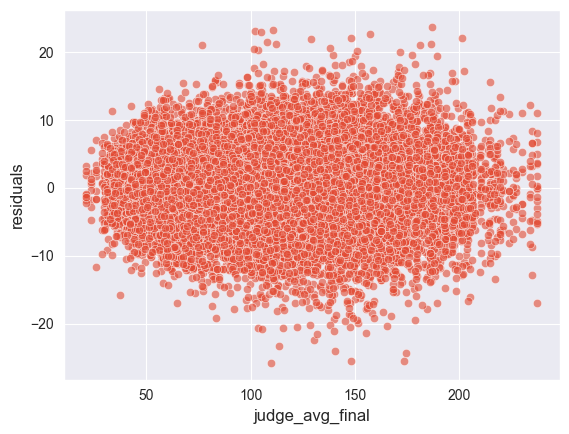

In [73]:
# predictor vs residuals
# testing: E[e | X] = 0 => expect dots to be centered around 0
# testing: Var(e | X) = sigma^2 => expect dots to be roughly same clustering from 0
sns.scatterplot(data=regression_df, x="judge_avg_final", y="residuals", alpha=0.6)
plt.show()

<Axes: xlabel='residuals', ylabel='Density'>

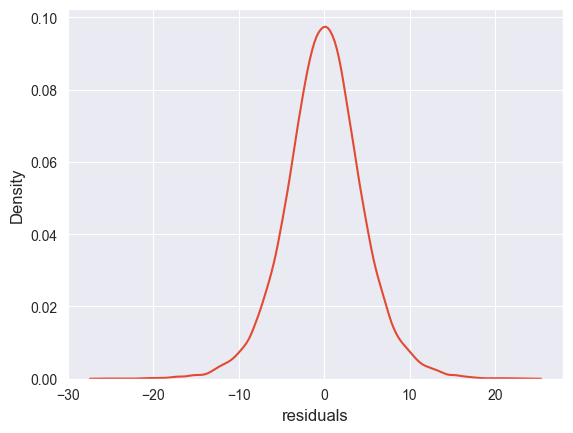

In [74]:
# distribution of residuals
sns.kdeplot(data=regression_df, x="residuals")

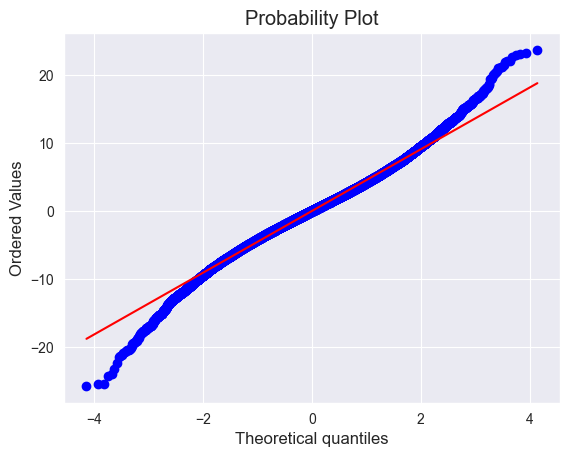

In [75]:
stats.probplot(regression_df["residuals"], dist='norm', plot=plt)
plt.show()

In [76]:
# residuals independent of sample?
fig = px.scatter(
    regression_df,
    x="judge_avg_final",
    y="residuals",
    color="competition",
    opacity=0.6,
)

fig.show()

In [77]:
fig = px.scatter(
    regression_df,
    x="judge_avg_final",
    y="residuals",
    color="isu_year",
    opacity=0.6,
)

fig.show()

In [94]:
# residuals independent of sample?
fig = px.scatter(
    regression_df,
    x="judge_avg_final",
    y="residuals",
    color="is_short_program",
    opacity=0.6,
)

fig.show()